In [1]:
import os
import numpy as np
import yaml
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from lsst.daf.butler import Butler
from lsst.afw.cameraGeom import FIELD_ANGLE
from lsst.ts.wep.utils import convertZernikesToPsfWidth

In [3]:
def load_opd_wep_results(dir_name, iter_num):
    with open(os.path.join(dir_name, f'iter{iter_num}', 'img', 'opd.zer'), 'r') as f:
        opd = yaml.safe_load(f)
    with open(os.path.join(dir_name, f'iter{iter_num}', 'img', 'wfs.zer'), 'r') as f:
        wep = yaml.safe_load(f)
    return opd, wep

In [4]:
def load_pssn_results(dir_name, iter_num):
    pssn_in = np.genfromtxt(os.path.join(dir_name, f'iter{iter_num}', 'img', 'PSSN.txt'))
    return pssn_in[0], pssn_in[1]

In [7]:
from lsst.obs.lsst import LsstCam, LsstComCamSim
camera = LsstCam.getCamera()
comcam = LsstComCamSim.getCamera()

In [8]:
fam_center_ids = np.arange(4, 189, 9)
comcam_det_ids = np.arange(9)
cwfs_det_ids = [191, 195, 199, 203]

In [9]:
def get_opd_comparison(det_ids, opd_results, wep_results, camera):
    differences = []
    field_distance = []
    for det_num in det_ids:
        det = camera[det_num]
        pt = det.getCenter(FIELD_ANGLE)
        field_distance.append(np.sqrt(np.sum(np.square(np.degrees(pt)))))
        differences.append(np.loadtxt(opd_results[det_num])/1e3 - np.loadtxt(wep_results[det_num]))   
    return np.array(field_distance), np.array(differences)

In [10]:
def get_opd_comparison_fwhm(det_ids, opd_results, wep_results, camera):
    differences = []
    field_distance = []
    for det_num in det_ids:
        det = camera[det_num]
        pt = det.getCenter(FIELD_ANGLE)
        field_distance.append(np.sqrt(np.sum(np.square(np.degrees(pt)))))
        differences.append(np.sqrt(np.sum(np.square(convertZernikesToPsfWidth(np.loadtxt(opd_results[det_num])/1e3 - np.loadtxt(wep_results[det_num]))))))
    return np.array(field_distance), np.array(differences)

# Old TIE vs New TIE

## On-Axis Comparisons

In [11]:
dir_name = 'old_tie/single_donut_lsstfam_large_pert_on_axis/'
opd_old_tie_on_axis = {}
wep_old_tie_on_axis = {}
pssn_vals_old_tie_on_axis = []
fwhm_vals_old_tie_on_axis = []
for iter_num in range(10):
    opd_old_tie_on_axis[iter_num], wep_old_tie_on_axis[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_old_tie_on_axis_single_iter, fwhm_vals_old_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_old_tie_on_axis.append(pssn_vals_old_tie_on_axis_single_iter)
    fwhm_vals_old_tie_on_axis.append(fwhm_vals_old_tie_single_iter)
pssn_vals_old_tie_on_axis = np.array(pssn_vals_old_tie_on_axis).T
fwhm_vals_old_tie_on_axis = np.array(fwhm_vals_old_tie_on_axis).T

In [12]:
dir_name = 'new_tie/single_donut_lsstfam_large_pert_on_axis/'
opd_new_tie_on_axis = {}
wep_new_tie_on_axis = {}
pssn_vals_new_tie_on_axis = []
fwhm_vals_new_tie_on_axis = []
for iter_num in range(10):
    opd_new_tie_on_axis[iter_num], wep_new_tie_on_axis[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_new_tie_on_axis_single_iter, fwhm_vals_new_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_new_tie_on_axis.append(pssn_vals_new_tie_on_axis_single_iter)
    fwhm_vals_new_tie_on_axis.append(fwhm_vals_new_tie_single_iter)
pssn_vals_new_tie_on_axis = np.array(pssn_vals_new_tie_on_axis).T
fwhm_vals_new_tie_on_axis = np.array(fwhm_vals_new_tie_on_axis).T

### First Iteration

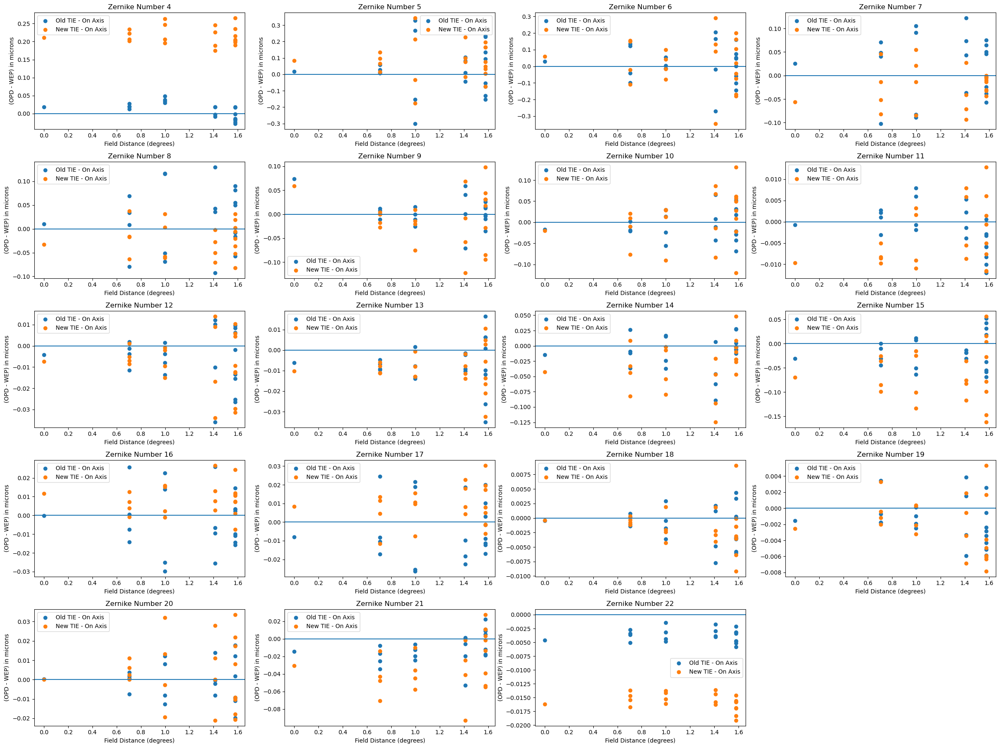

In [17]:
iter_num = 0
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_on_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_old_tie_on_axis[iter_num], wep_old_tie_on_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_on_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_new_tie_on_axis[iter_num], wep_new_tie_on_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_on_axis_iter_0[:, i-4], label='Old TIE - On Axis')
    plt.scatter(new_tie_field_distance, new_tie_differences_on_axis_iter_0[:, i-4], label='New TIE - On Axis')
    plt.axhline(0)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

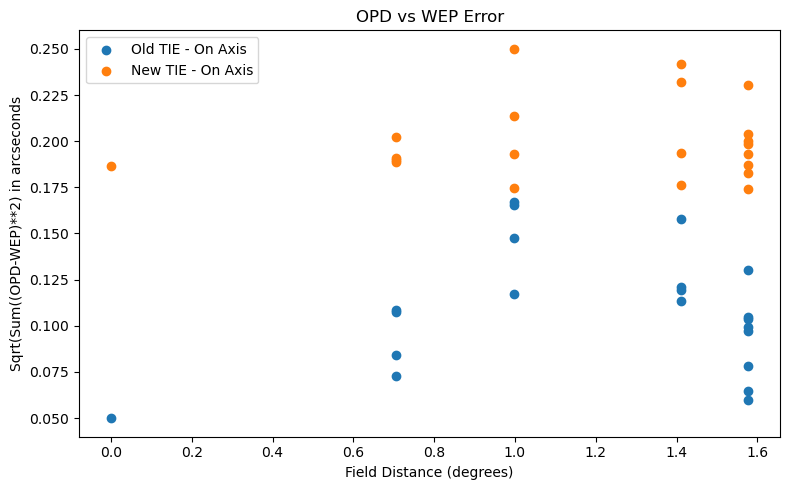

In [16]:
fig = plt.figure(figsize=(8,5))
old_tie_field_distance, old_tie_differences_on_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_old_tie_on_axis[iter_num], wep_old_tie_on_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_on_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_on_axis[iter_num], wep_new_tie_on_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_on_axis_fwhm_iter_0, label='Old TIE - On Axis')
plt.scatter(new_tie_field_distance, new_tie_differences_on_axis_fwhm_iter_0, label='New TIE - On Axis')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend()
plt.tight_layout()

### Final Iteration

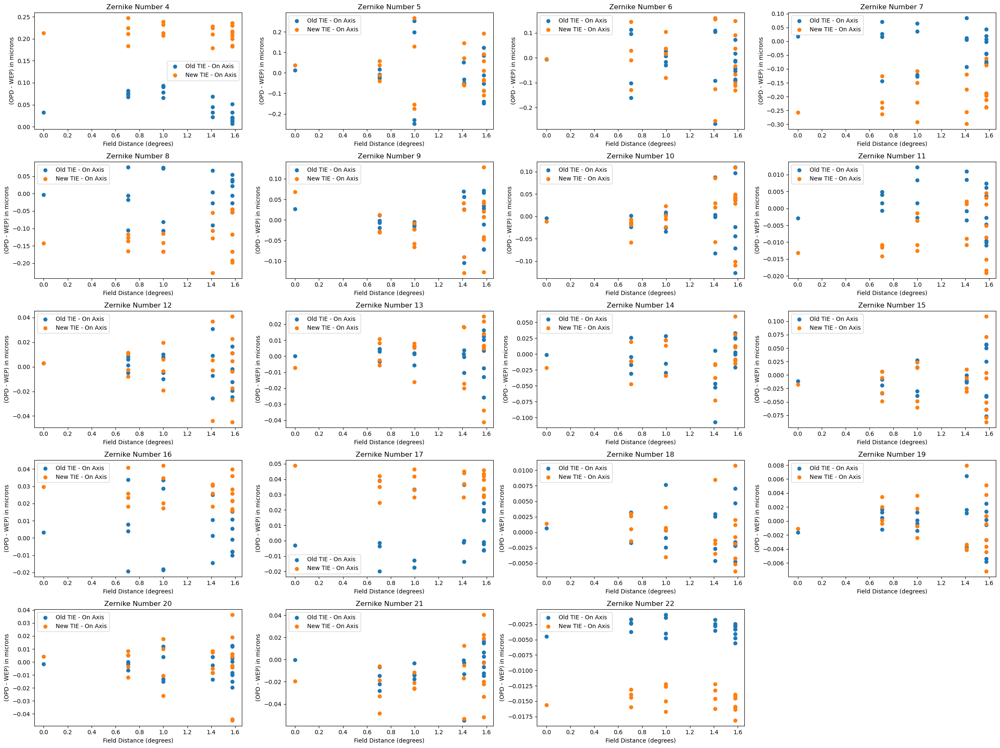

In [20]:
iter_num = 9
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_on_axis_iter_9 = get_opd_comparison(fam_center_ids, opd_old_tie_on_axis[iter_num], wep_old_tie_on_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_on_axis_iter_9 = get_opd_comparison(fam_center_ids, opd_new_tie_on_axis[iter_num], wep_new_tie_on_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_on_axis_iter_9[:, i-4], label='Old TIE - On Axis')
    plt.scatter(new_tie_field_distance, new_tie_differences_on_axis_iter_9[:, i-4], label='New TIE - On Axis')
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

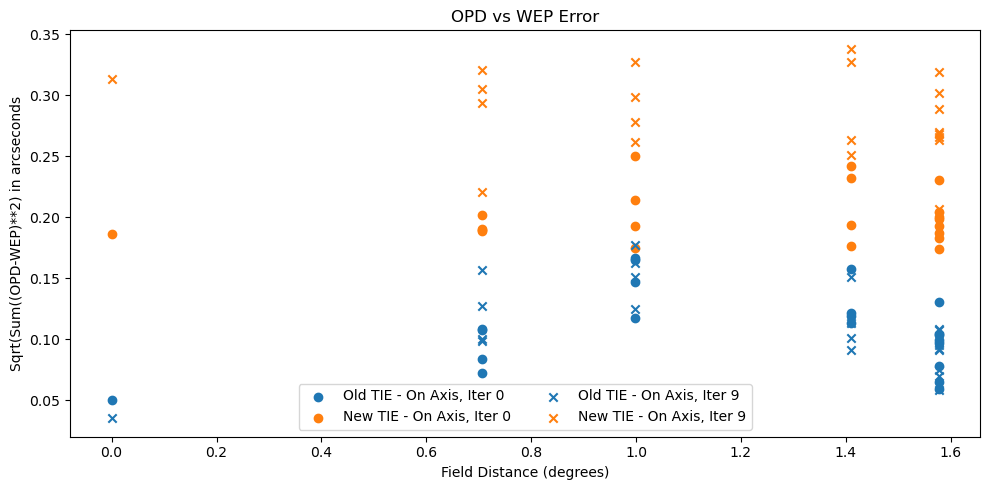

In [21]:
fig = plt.figure(figsize=(10,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_on_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_old_tie_on_axis[iter_num], wep_old_tie_on_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_on_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_on_axis[iter_num], wep_new_tie_on_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_on_axis_fwhm_iter_0, label='Old TIE - On Axis, Iter 0')
plt.scatter(new_tie_field_distance, new_tie_differences_on_axis_fwhm_iter_0, label='New TIE - On Axis, Iter 0')
plt.scatter(old_tie_field_distance, old_tie_differences_on_axis_fwhm_iter_9, label='Old TIE - On Axis, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_on_axis_fwhm_iter_9, label='New TIE - On Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=2)
plt.tight_layout()

### Convergence

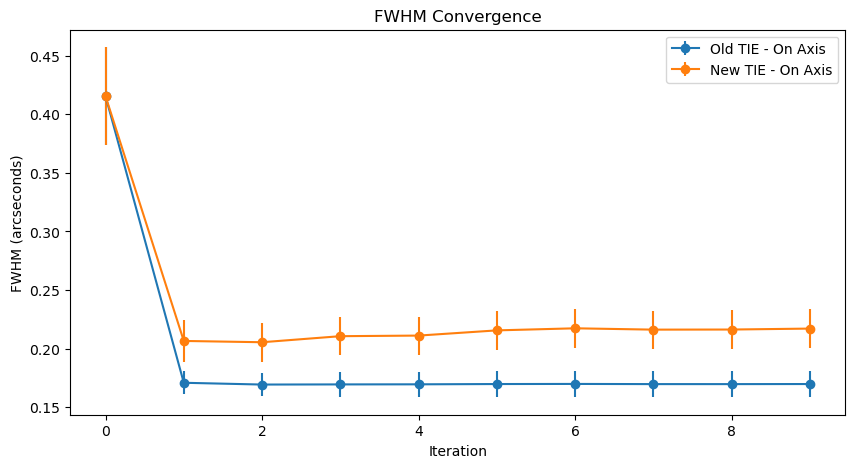

In [22]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(10), np.mean(fwhm_vals_old_tie_on_axis, axis=0), yerr=np.std(fwhm_vals_old_tie_on_axis, axis=0), marker='o', label='Old TIE - On Axis')
plt.errorbar(np.arange(10), np.mean(fwhm_vals_new_tie_on_axis, axis=0), yerr=np.std(fwhm_vals_new_tie_on_axis, axis=0), marker='o', label='New TIE - On Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

## Off-Axis Comparisons

In [23]:
dir_name = 'old_tie/single_donut_lsstfam_large_pert_off_axis/'
opd_old_tie_off_axis = {}
wep_old_tie_off_axis = {}
pssn_vals_old_tie_off_axis = []
fwhm_vals_old_tie_off_axis = []
for iter_num in range(10):
    opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_old_tie_off_axis_single_iter, fwhm_vals_old_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_old_tie_off_axis.append(pssn_vals_old_tie_off_axis_single_iter)
    fwhm_vals_old_tie_off_axis.append(fwhm_vals_old_tie_single_iter)
pssn_vals_old_tie_off_axis = np.array(pssn_vals_old_tie_off_axis).T
fwhm_vals_old_tie_off_axis = np.array(fwhm_vals_old_tie_off_axis).T

In [24]:
dir_name = 'new_tie/single_donut_lsstfam_large_pert_off_axis/'
opd_new_tie_off_axis = {}
wep_new_tie_off_axis = {}
pssn_vals_new_tie_off_axis = []
fwhm_vals_new_tie_off_axis = []
for iter_num in range(10):
    opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_new_tie_off_axis_single_iter, fwhm_vals_new_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_new_tie_off_axis.append(pssn_vals_new_tie_off_axis_single_iter)
    fwhm_vals_new_tie_off_axis.append(fwhm_vals_new_tie_single_iter)
pssn_vals_new_tie_off_axis = np.array(pssn_vals_new_tie_off_axis).T
fwhm_vals_new_tie_off_axis = np.array(fwhm_vals_new_tie_off_axis).T

### First Iteration

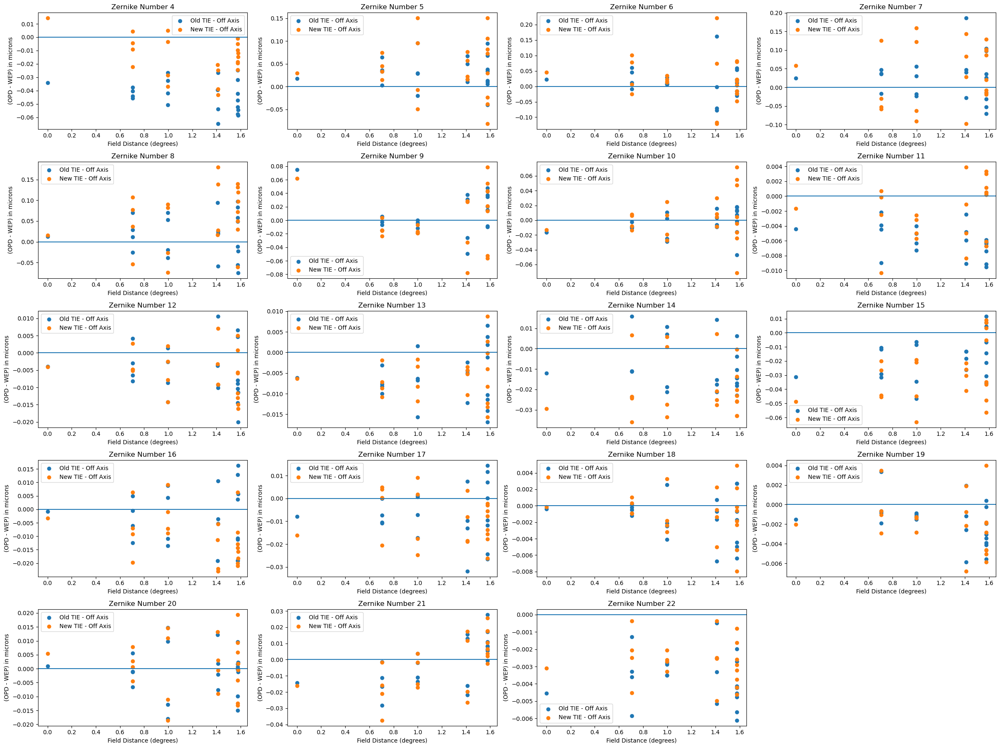

In [25]:
iter_num = 0
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_iter_0[:, i-4], label='Old TIE - Off Axis')
    plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_iter_0[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0, 0, 1.6)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

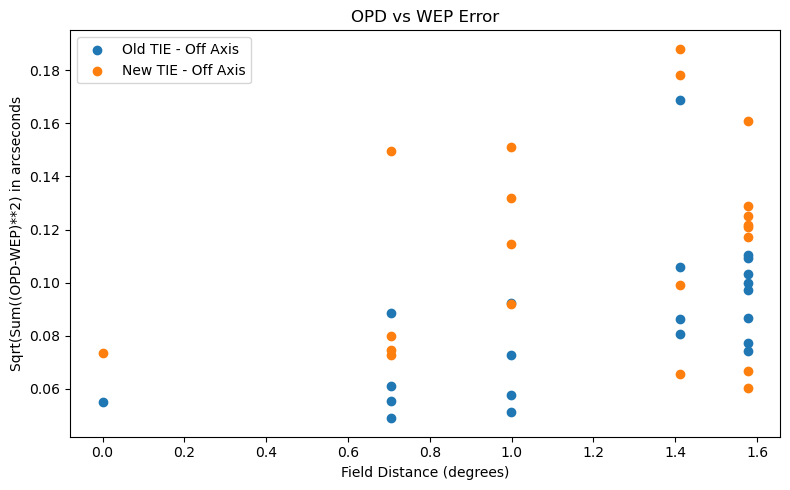

In [27]:
fig = plt.figure(figsize=(8,5))
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0, label='Old TIE - Off Axis')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0, label='New TIE - Off Axis')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend()
plt.tight_layout()

### Final Iteration

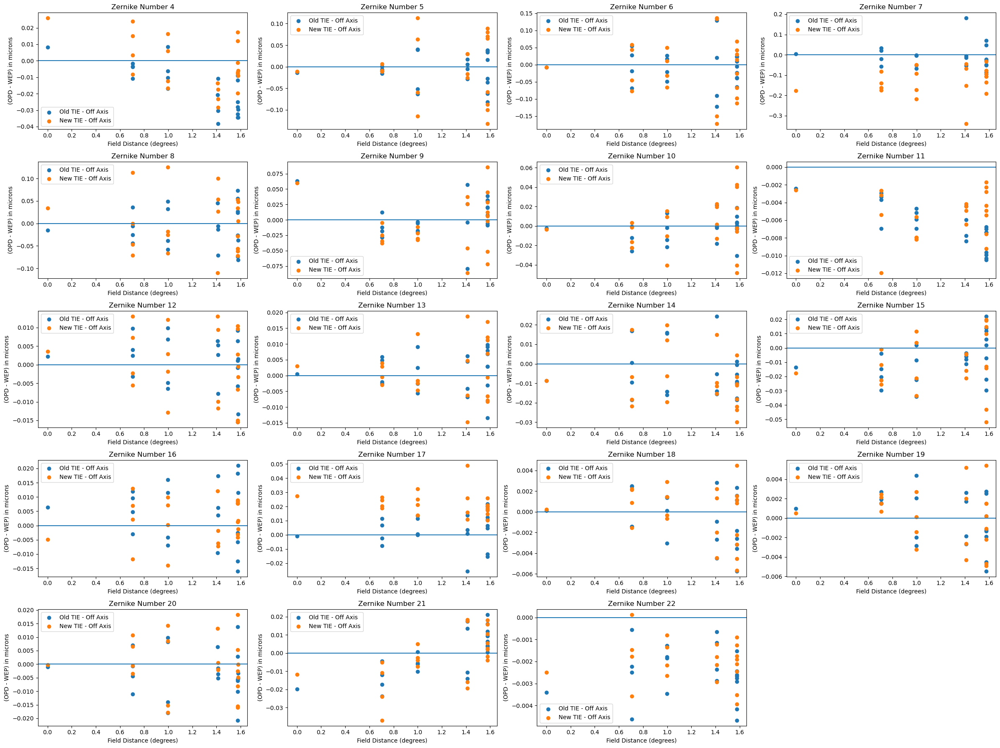

In [28]:
iter_num = 9
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_off_axis_iter_9 = get_opd_comparison(fam_center_ids, opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_iter_9 = get_opd_comparison(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_iter_9[:, i-4], label='Old TIE - Off Axis')
    plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_iter_9[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

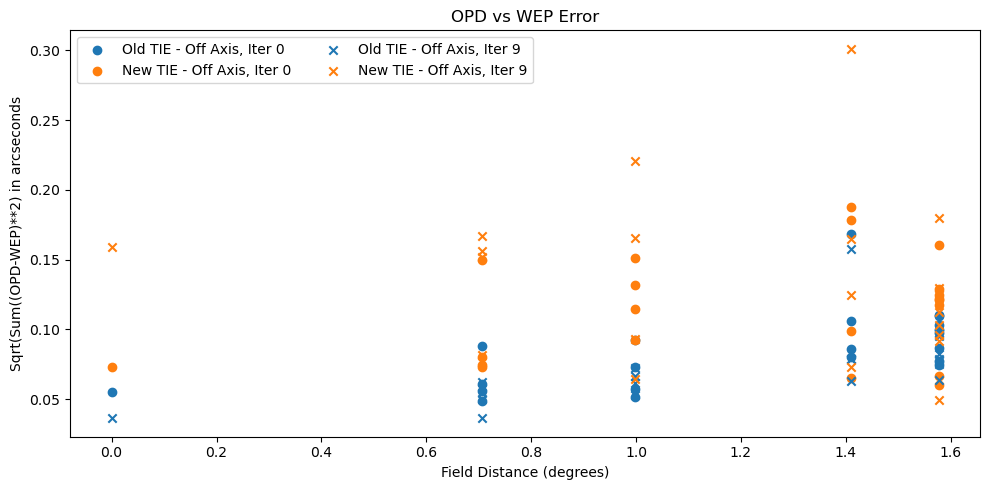

In [29]:
fig = plt.figure(figsize=(10,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0, label='Old TIE - Off Axis, Iter 0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0, label='New TIE - Off Axis, Iter 0')
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9, label='Old TIE - Off Axis, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=2)
plt.tight_layout()

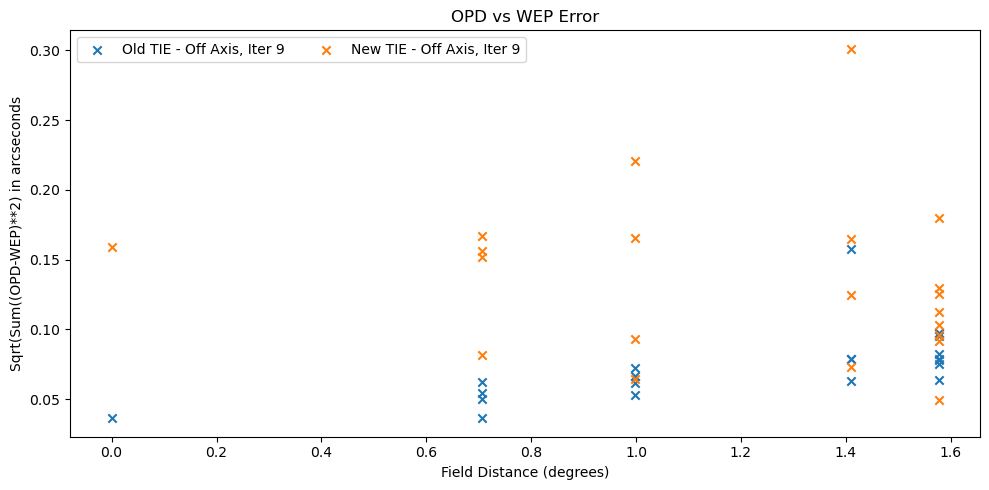

In [31]:
fig = plt.figure(figsize=(10,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9, label='Old TIE - Off Axis, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=2)
plt.tight_layout()

### Convergence

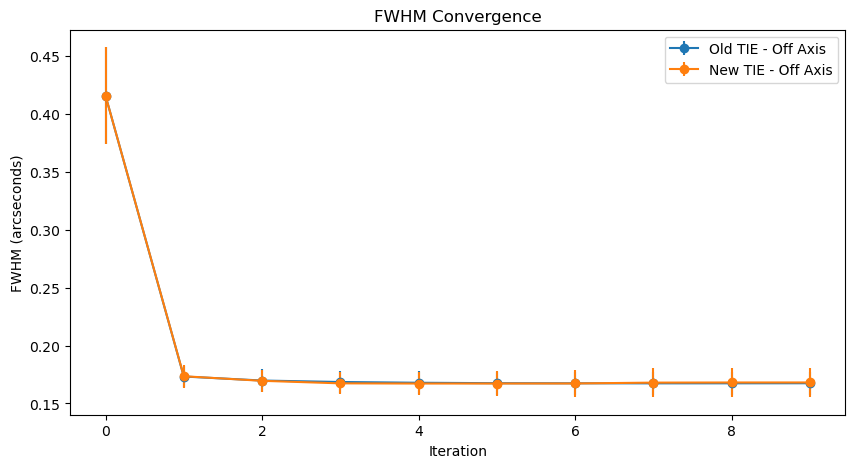

In [32]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(10), np.mean(fwhm_vals_old_tie_off_axis, axis=0), yerr=np.std(fwhm_vals_old_tie_off_axis, axis=0), marker='o', label='Old TIE - Off Axis')
plt.errorbar(np.arange(10), np.mean(fwhm_vals_new_tie_off_axis, axis=0), yerr=np.std(fwhm_vals_new_tie_off_axis, axis=0), marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

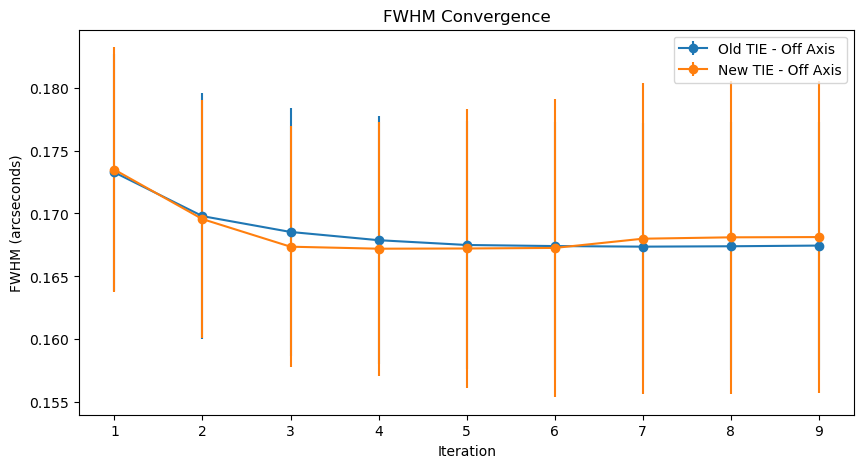

In [33]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_old_tie_off_axis, axis=0)[1:], yerr=np.std(fwhm_vals_old_tie_off_axis, axis=0)[1:], marker='o', label='Old TIE - Off Axis')
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_new_tie_off_axis, axis=0)[1:], yerr=np.std(fwhm_vals_new_tie_off_axis, axis=0)[1:], marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

## Off-Axis Comparisons - No Initial Perturbation

In [34]:
dir_name = 'old_tie/single_donut_lsstfam_no_pert_off_axis/'
opd_old_tie_off_axis = {}
wep_old_tie_off_axis = {}
pssn_vals_old_tie_off_axis = []
fwhm_vals_old_tie_off_axis = []
for iter_num in range(10):
    opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_old_tie_off_axis_single_iter, fwhm_vals_old_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_old_tie_off_axis.append(pssn_vals_old_tie_off_axis_single_iter)
    fwhm_vals_old_tie_off_axis.append(fwhm_vals_old_tie_single_iter)
pssn_vals_old_tie_off_axis = np.array(pssn_vals_old_tie_off_axis).T
fwhm_vals_old_tie_off_axis = np.array(fwhm_vals_old_tie_off_axis).T

In [35]:
dir_name = 'new_tie/single_donut_lsstfam_no_pert_off_axis/'
opd_new_tie_off_axis = {}
wep_new_tie_off_axis = {}
pssn_vals_new_tie_off_axis = []
fwhm_vals_new_tie_off_axis = []
for iter_num in range(10):
    opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_new_tie_off_axis_single_iter, fwhm_vals_new_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_new_tie_off_axis.append(pssn_vals_new_tie_off_axis_single_iter)
    fwhm_vals_new_tie_off_axis.append(fwhm_vals_new_tie_single_iter)
pssn_vals_new_tie_off_axis = np.array(pssn_vals_new_tie_off_axis).T
fwhm_vals_new_tie_off_axis = np.array(fwhm_vals_new_tie_off_axis).T

### First Iteration

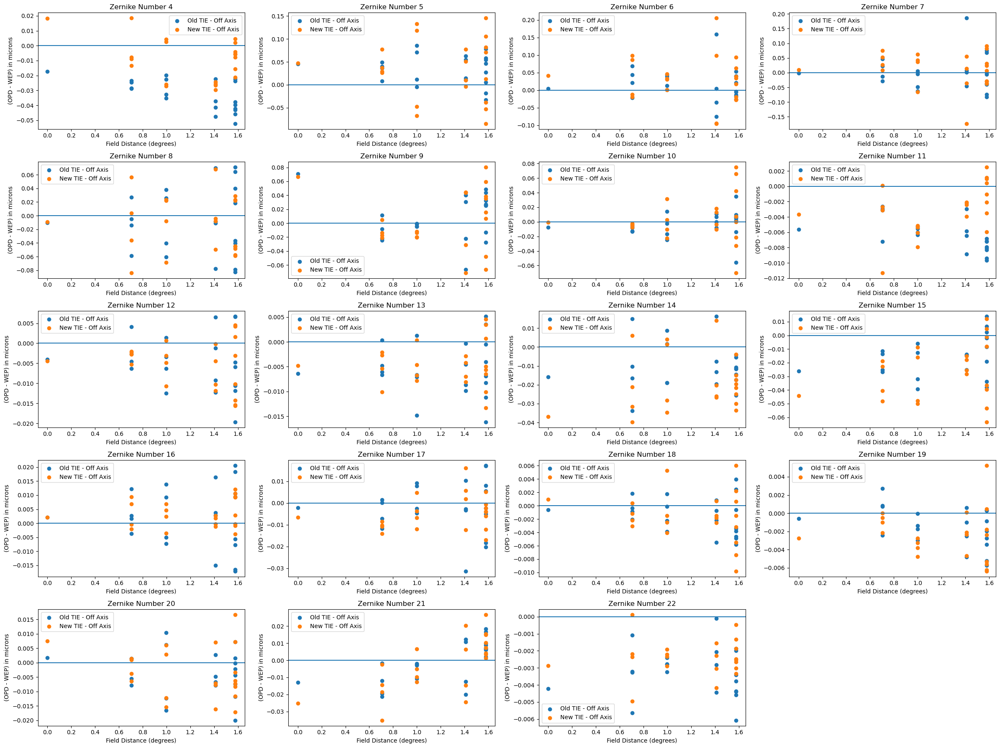

In [37]:
iter_num = 0
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_iter_0[:, i-4], label='Old TIE - Off Axis')
    plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_iter_0[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

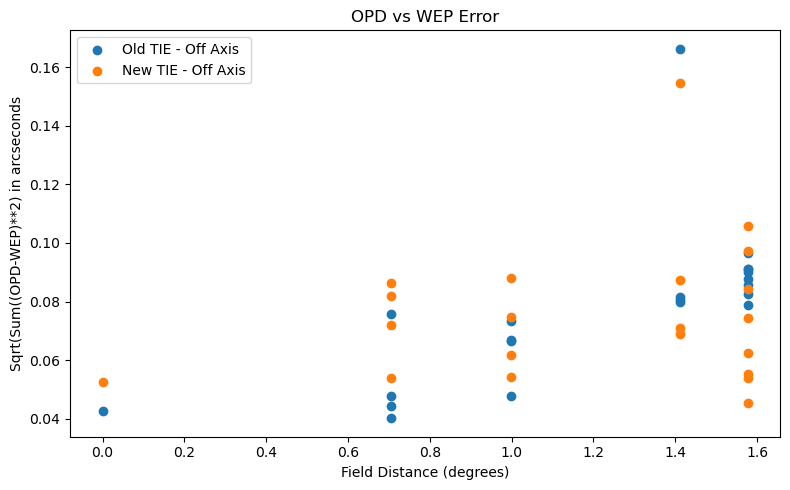

In [38]:
fig = plt.figure(figsize=(8,5))
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0, label='Old TIE - Off Axis')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0, label='New TIE - Off Axis')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend()
plt.tight_layout()

### Final Iteration

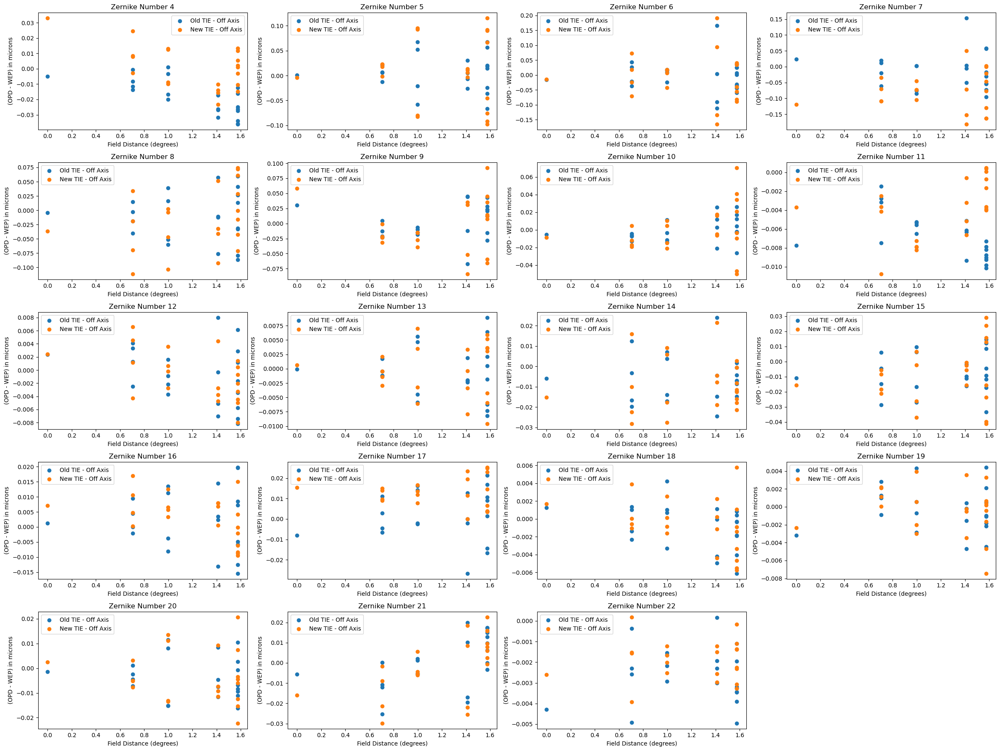

In [40]:
iter_num = 9
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_off_axis_iter_9 = get_opd_comparison(fam_center_ids, opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_iter_9 = get_opd_comparison(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_iter_9[:, i-4], label='Old TIE - Off Axis')
    plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_iter_9[:, i-4], label='New TIE - Off Axis')
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

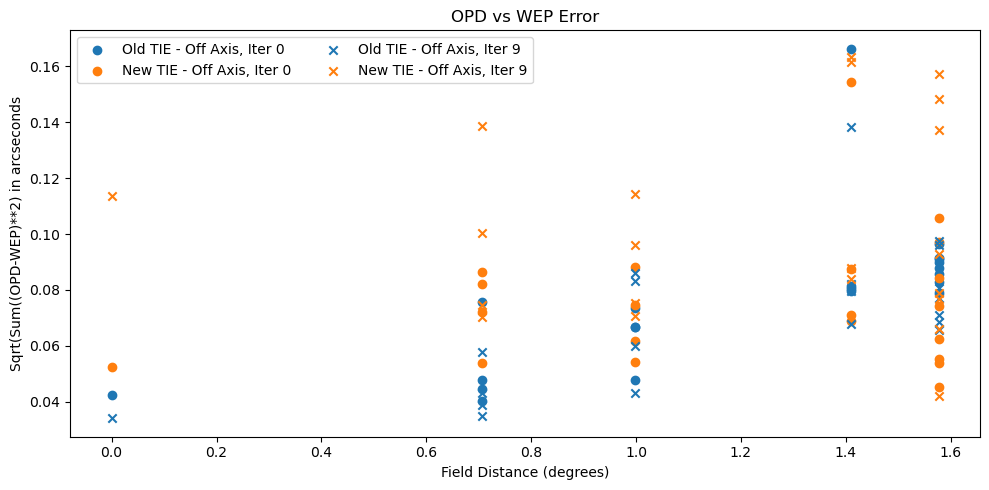

In [41]:
fig = plt.figure(figsize=(10,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0, label='Old TIE - Off Axis, Iter 0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0, label='New TIE - Off Axis, Iter 0')
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9, label='Old TIE - Off Axis, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=2)
plt.tight_layout()

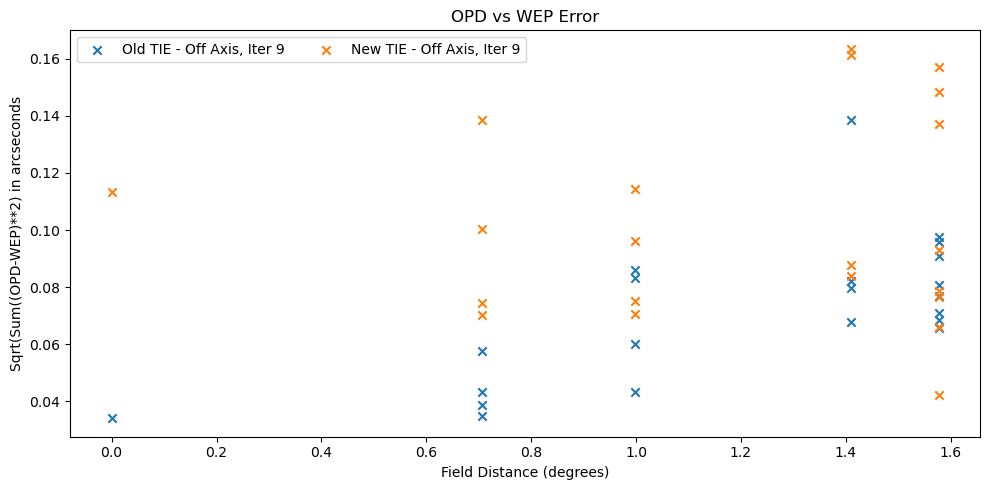

In [43]:
fig = plt.figure(figsize=(10,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_old_tie_off_axis[iter_num], wep_old_tie_off_axis[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9, label='Old TIE - Off Axis, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=2)
plt.tight_layout()

### Convergence

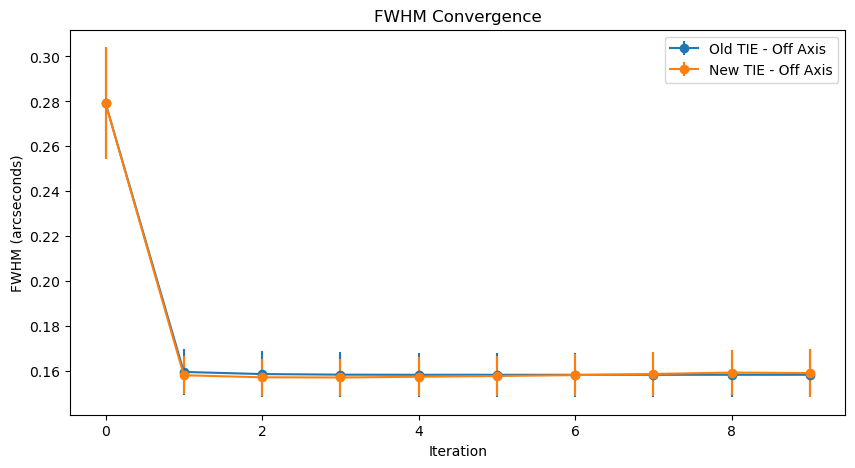

In [44]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(10), np.mean(fwhm_vals_old_tie_off_axis, axis=0), yerr=np.std(fwhm_vals_old_tie_off_axis, axis=0), marker='o', label='Old TIE - Off Axis')
plt.errorbar(np.arange(10), np.mean(fwhm_vals_new_tie_off_axis, axis=0), yerr=np.std(fwhm_vals_new_tie_off_axis, axis=0), marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

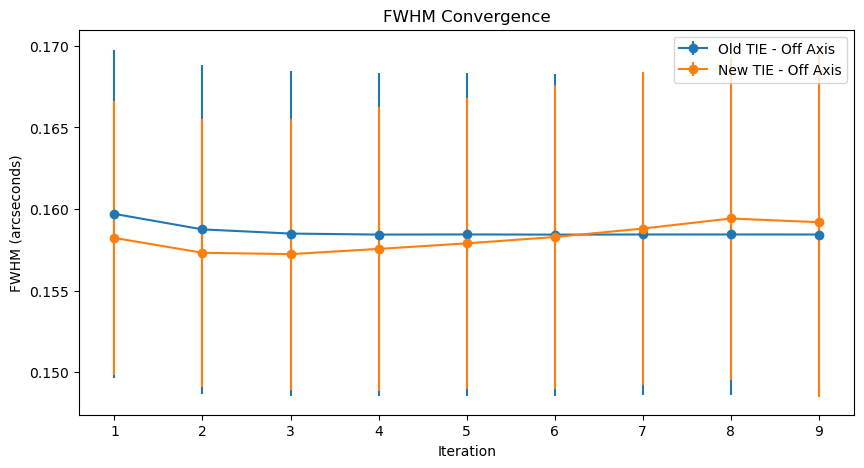

In [45]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_old_tie_off_axis, axis=0)[1:], yerr=np.std(fwhm_vals_old_tie_off_axis, axis=0)[1:], marker='o', label='Old TIE - Off Axis')
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_new_tie_off_axis, axis=0)[1:], yerr=np.std(fwhm_vals_new_tie_off_axis, axis=0)[1:], marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

## CWFS Comparisons

In [46]:
dir_name = 'old_tie/single_donut_cwfs/'
opd_old_tie_cwfs = {}
wep_old_tie_cwfs = {}
pssn_vals_old_tie_cwfs = []
fwhm_vals_old_tie_cwfs = []
for iter_num in range(10):
    opd_old_tie_cwfs[iter_num], wep_old_tie_cwfs[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_old_tie_cwfs_single_iter, fwhm_vals_old_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_old_tie_cwfs.append(pssn_vals_old_tie_cwfs_single_iter)
    fwhm_vals_old_tie_cwfs.append(fwhm_vals_old_tie_single_iter)
pssn_vals_old_tie_cwfs = np.array(pssn_vals_old_tie_cwfs).T
fwhm_vals_old_tie_cwfs = np.array(fwhm_vals_old_tie_cwfs).T

In [47]:
dir_name = 'new_tie/single_donut_cwfs/'
opd_new_tie_cwfs = {}
wep_new_tie_cwfs = {}
pssn_vals_new_tie_cwfs = []
fwhm_vals_new_tie_cwfs = []
for iter_num in range(10):
    opd_new_tie_cwfs[iter_num], wep_new_tie_cwfs[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_new_tie_cwfs_single_iter, fwhm_vals_new_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_new_tie_cwfs.append(pssn_vals_new_tie_cwfs_single_iter)
    fwhm_vals_new_tie_cwfs.append(fwhm_vals_new_tie_single_iter)
pssn_vals_new_tie_cwfs = np.array(pssn_vals_new_tie_cwfs).T
fwhm_vals_new_tie_cwfs = np.array(fwhm_vals_new_tie_cwfs).T

### First Iteration

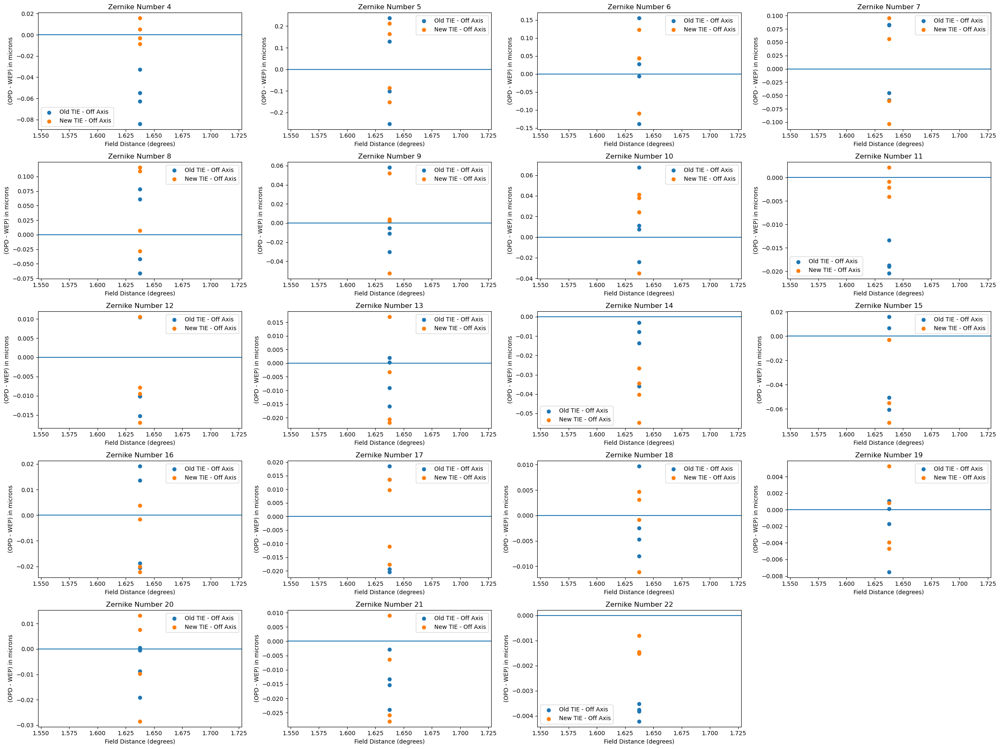

In [49]:
iter_num = 0
cwfs_det_ids = [191, 195, 199, 203]
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_cwfs_iter_0 = get_opd_comparison(cwfs_det_ids, opd_old_tie_cwfs[iter_num], wep_old_tie_cwfs[iter_num], camera)
new_tie_field_distance, new_tie_differences_cwfs_iter_0 = get_opd_comparison(cwfs_det_ids, opd_new_tie_cwfs[iter_num], wep_new_tie_cwfs[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_iter_0[:, i-4], label='Old TIE - Off Axis')
    plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_iter_0[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

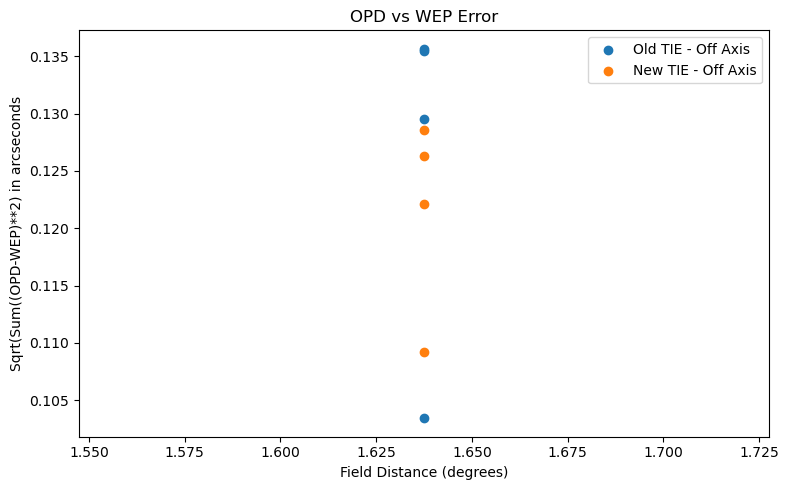

In [50]:
fig = plt.figure(figsize=(8,5))
old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_0 = get_opd_comparison_fwhm(cwfs_det_ids, opd_old_tie_cwfs[iter_num], wep_old_tie_cwfs[iter_num], camera)
new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_0 = get_opd_comparison_fwhm(cwfs_det_ids, opd_new_tie_cwfs[iter_num], wep_new_tie_cwfs[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_0, label='Old TIE - Off Axis')
plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_0, label='New TIE - Off Axis')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend()
plt.tight_layout()

### Final Iteration

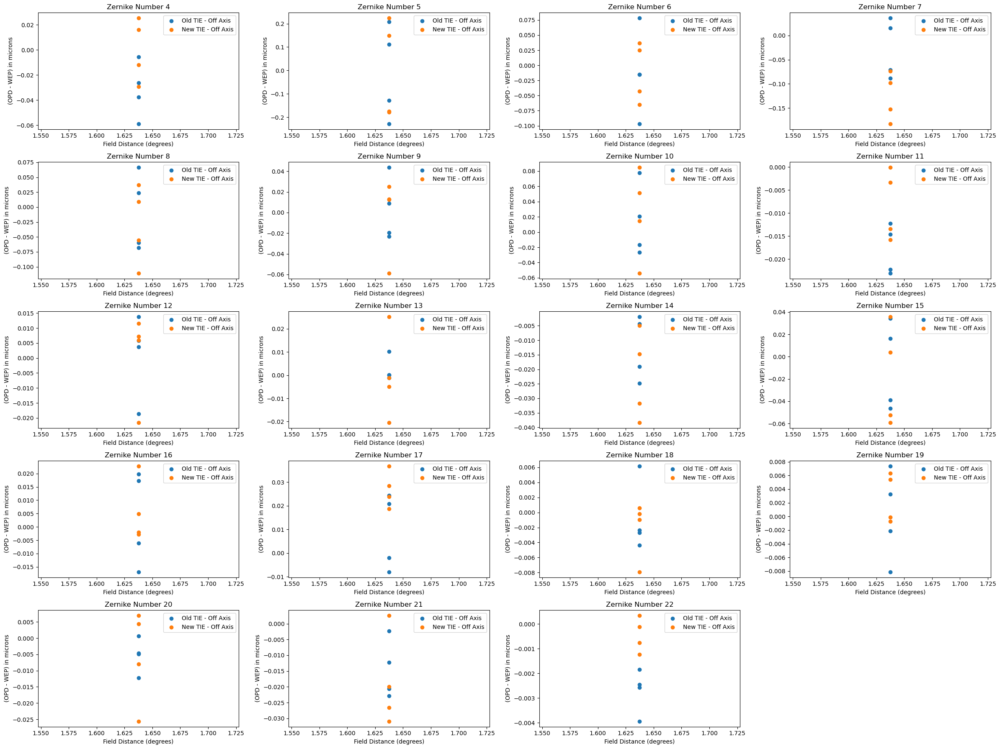

In [52]:
iter_num = 9
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_cwfs_iter_9 = get_opd_comparison(cwfs_det_ids, opd_old_tie_cwfs[iter_num], wep_old_tie_cwfs[iter_num], camera)
new_tie_field_distance, new_tie_differences_cwfs_iter_9 = get_opd_comparison(cwfs_det_ids, opd_new_tie_cwfs[iter_num], wep_new_tie_cwfs[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_iter_9[:, i-4], label='Old TIE - Off Axis')
    plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_iter_9[:, i-4], label='New TIE - Off Axis')
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

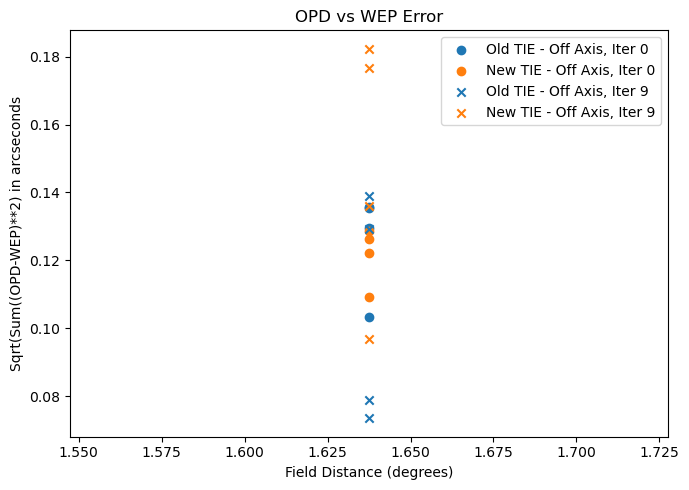

In [53]:
fig = plt.figure(figsize=(7,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_9 = get_opd_comparison_fwhm(cwfs_det_ids, opd_old_tie_cwfs[iter_num], wep_old_tie_cwfs[iter_num], camera)
new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_9 = get_opd_comparison_fwhm(cwfs_det_ids, opd_new_tie_cwfs[iter_num], wep_new_tie_cwfs[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_0, label='Old TIE - Off Axis, Iter 0')
plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_0, label='New TIE - Off Axis, Iter 0')
plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_9, label='Old TIE - Off Axis, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=1)
plt.tight_layout()

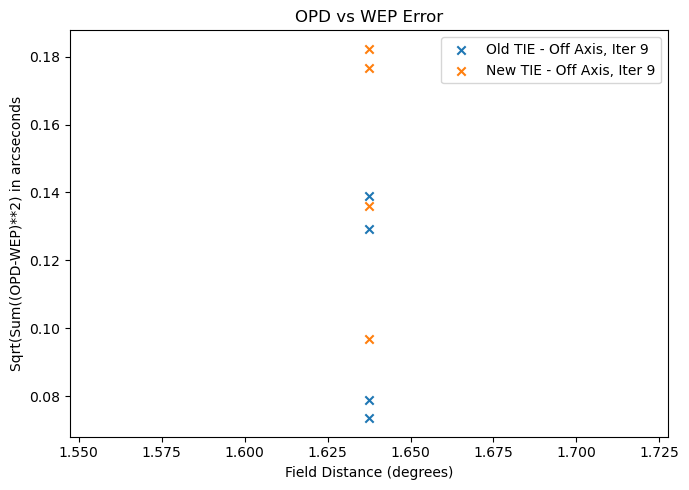

In [54]:
fig = plt.figure(figsize=(7,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_9 = get_opd_comparison_fwhm(cwfs_det_ids, opd_old_tie_cwfs[iter_num], wep_old_tie_cwfs[iter_num], camera)
new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_9 = get_opd_comparison_fwhm(cwfs_det_ids, opd_new_tie_cwfs[iter_num], wep_new_tie_cwfs[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_9, label='Old TIE - Off Axis, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=1)
plt.tight_layout()

### Convergence

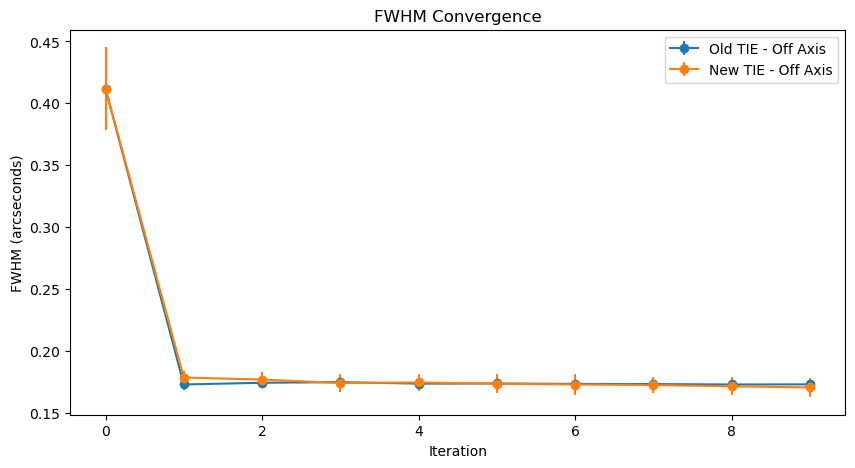

In [55]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(10), np.mean(fwhm_vals_old_tie_cwfs, axis=0), yerr=np.std(fwhm_vals_old_tie_cwfs, axis=0), marker='o', label='Old TIE - Off Axis')
plt.errorbar(np.arange(10), np.mean(fwhm_vals_new_tie_cwfs, axis=0), yerr=np.std(fwhm_vals_new_tie_cwfs, axis=0), marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

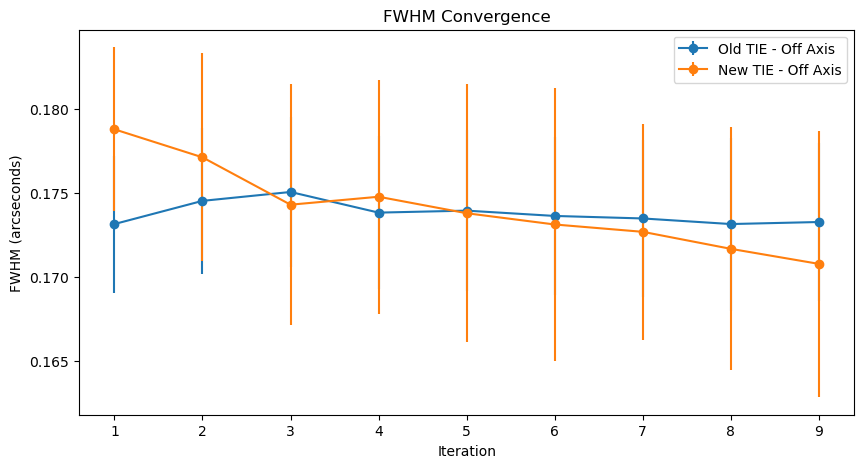

In [56]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_old_tie_cwfs, axis=0)[1:], yerr=np.std(fwhm_vals_old_tie_cwfs, axis=0)[1:], marker='o', label='Old TIE - Off Axis')
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_new_tie_cwfs, axis=0)[1:], yerr=np.std(fwhm_vals_new_tie_cwfs, axis=0)[1:], marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

## Comcam Comparisons

In [57]:
dir_name = 'old_tie/single_donut_comcam/'
opd_old_tie_comcam = {}
wep_old_tie_comcam = {}
pssn_vals_old_tie_comcam = []
fwhm_vals_old_tie_comcam = []
for iter_num in range(10):
    opd_old_tie_comcam[iter_num], wep_old_tie_comcam[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_old_tie_comcam_single_iter, fwhm_vals_old_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_old_tie_comcam.append(pssn_vals_old_tie_comcam_single_iter)
    fwhm_vals_old_tie_comcam.append(fwhm_vals_old_tie_single_iter)
pssn_vals_old_tie_comcam = np.array(pssn_vals_old_tie_comcam).T
fwhm_vals_old_tie_comcam = np.array(fwhm_vals_old_tie_comcam).T

In [58]:
dir_name = 'new_tie/single_donut_comcam/'
opd_new_tie_comcam = {}
wep_new_tie_comcam = {}
pssn_vals_new_tie_comcam = []
fwhm_vals_new_tie_comcam = []
for iter_num in range(10):
    opd_new_tie_comcam[iter_num], wep_new_tie_comcam[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_new_tie_comcam_single_iter, fwhm_vals_new_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_new_tie_comcam.append(pssn_vals_new_tie_comcam_single_iter)
    fwhm_vals_new_tie_comcam.append(fwhm_vals_new_tie_single_iter)
pssn_vals_new_tie_comcam = np.array(pssn_vals_new_tie_comcam).T
fwhm_vals_new_tie_comcam = np.array(fwhm_vals_new_tie_comcam).T

### First Iteration

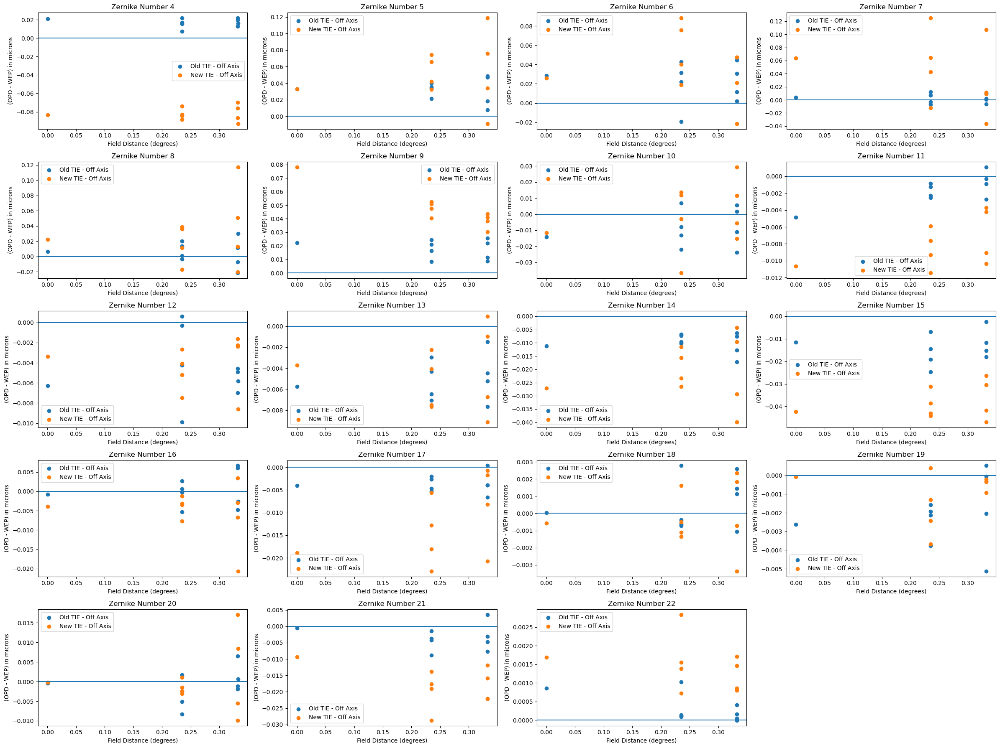

In [59]:
iter_num = 0
comcam_det_ids = np.arange(9)
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_comcam_iter_0 = get_opd_comparison(comcam_det_ids, opd_old_tie_comcam[iter_num], wep_old_tie_comcam[iter_num], comcam)
new_tie_field_distance, new_tie_differences_comcam_iter_0 = get_opd_comparison(comcam_det_ids, opd_new_tie_comcam[iter_num], wep_new_tie_comcam[iter_num], comcam)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_comcam_iter_0[:, i-4], label='Old TIE - Off Axis')
    plt.scatter(new_tie_field_distance, new_tie_differences_comcam_iter_0[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

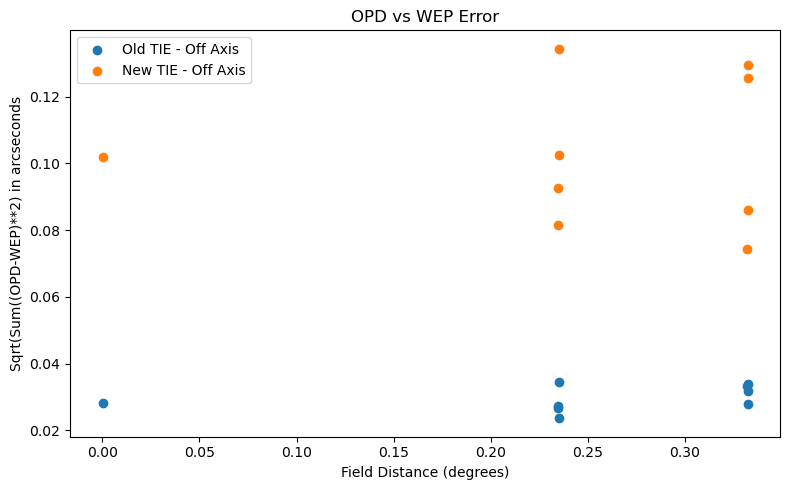

In [60]:
fig = plt.figure(figsize=(8,5))
old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_0 = get_opd_comparison_fwhm(comcam_det_ids, opd_old_tie_comcam[iter_num], wep_old_tie_comcam[iter_num], comcam)
new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_0 = get_opd_comparison_fwhm(comcam_det_ids, opd_new_tie_comcam[iter_num], wep_new_tie_comcam[iter_num], comcam)
plt.scatter(old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_0, label='Old TIE - Off Axis')
plt.scatter(new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_0, label='New TIE - Off Axis')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend()
plt.tight_layout()

### Final Iteration

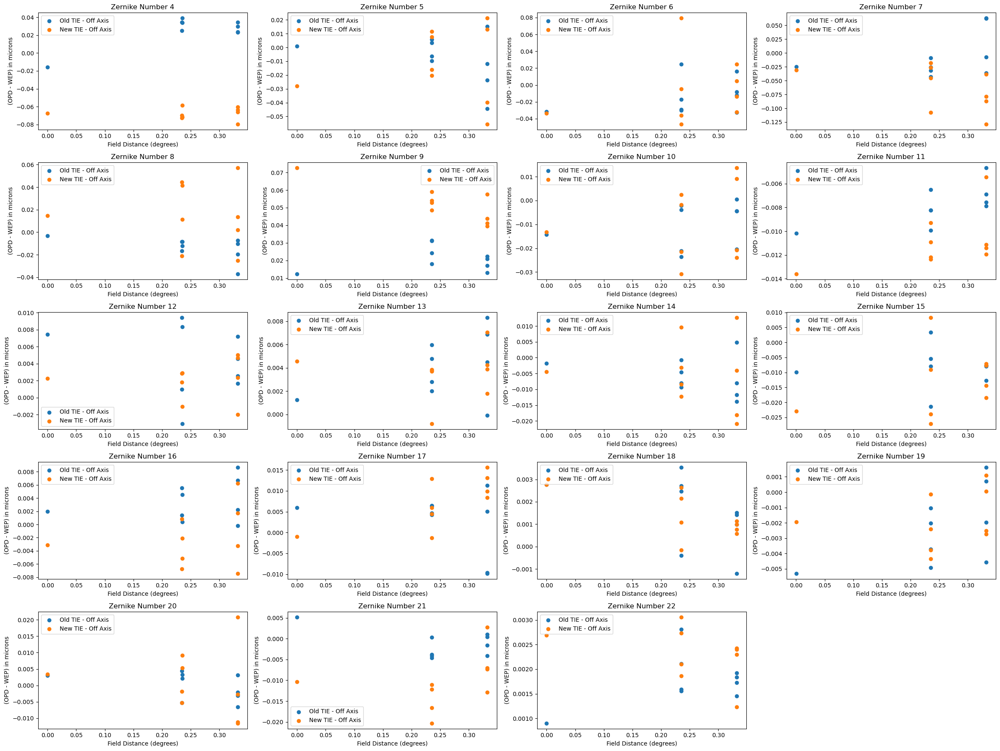

In [61]:
iter_num = 9
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_comcam_iter_9 = get_opd_comparison(comcam_det_ids, opd_old_tie_comcam[iter_num], wep_old_tie_comcam[iter_num], comcam)
new_tie_field_distance, new_tie_differences_comcam_iter_9 = get_opd_comparison(comcam_det_ids, opd_new_tie_comcam[iter_num], wep_new_tie_comcam[iter_num], comcam)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_comcam_iter_9[:, i-4], label='Old TIE - Off Axis')
    plt.scatter(new_tie_field_distance, new_tie_differences_comcam_iter_9[:, i-4], label='New TIE - Off Axis')
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

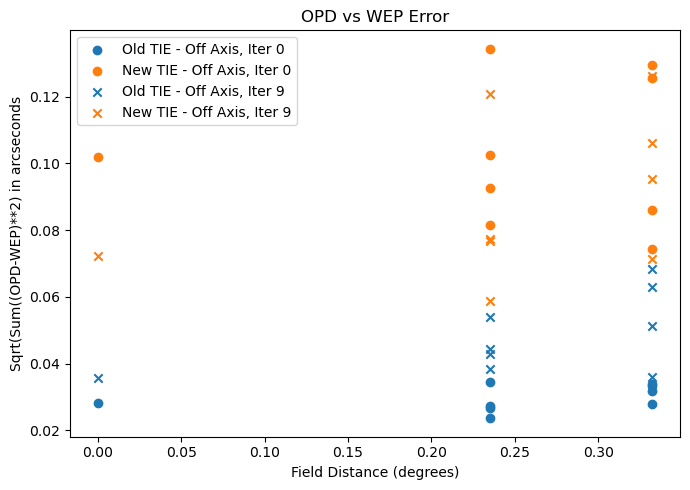

In [62]:
fig = plt.figure(figsize=(7,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_9 = get_opd_comparison_fwhm(comcam_det_ids, opd_old_tie_comcam[iter_num], wep_old_tie_comcam[iter_num], comcam)
new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_9 = get_opd_comparison_fwhm(comcam_det_ids, opd_new_tie_comcam[iter_num], wep_new_tie_comcam[iter_num], comcam)
plt.scatter(old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_0, label='Old TIE - Off Axis, Iter 0')
plt.scatter(new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_0, label='New TIE - Off Axis, Iter 0')
plt.scatter(old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_9, label='Old TIE - Off Axis, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=1)
plt.tight_layout()

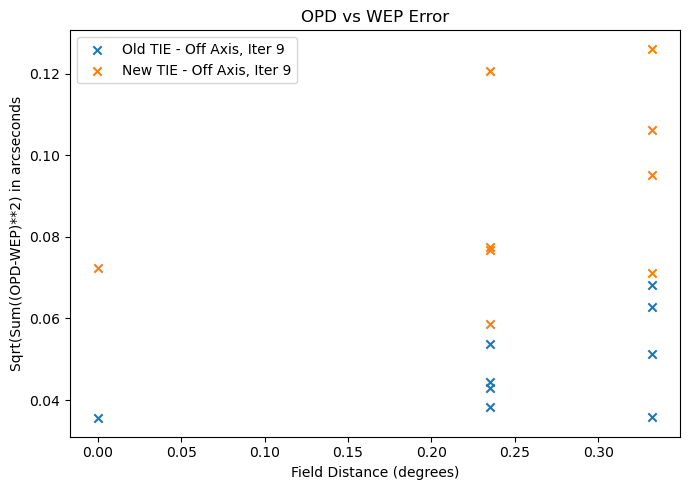

In [63]:
fig = plt.figure(figsize=(7,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_9 = get_opd_comparison_fwhm(comcam_det_ids, opd_old_tie_comcam[iter_num], wep_old_tie_comcam[iter_num], comcam)
new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_9 = get_opd_comparison_fwhm(comcam_det_ids, opd_new_tie_comcam[iter_num], wep_new_tie_comcam[iter_num], comcam)
plt.scatter(old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_9, label='Old TIE - Off Axis, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=1)
plt.tight_layout()

### Convergence

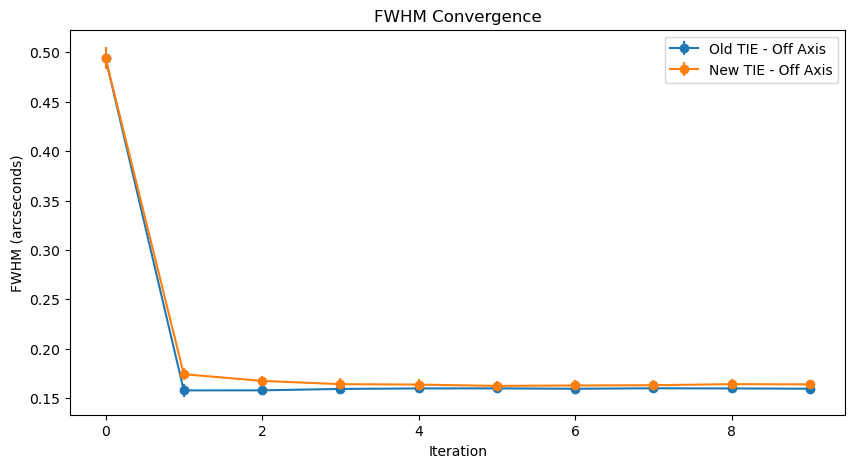

In [64]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(10), np.mean(fwhm_vals_old_tie_comcam, axis=0), yerr=np.std(fwhm_vals_old_tie_comcam, axis=0), marker='o', label='Old TIE - Off Axis')
plt.errorbar(np.arange(10), np.mean(fwhm_vals_new_tie_comcam, axis=0), yerr=np.std(fwhm_vals_new_tie_comcam, axis=0), marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

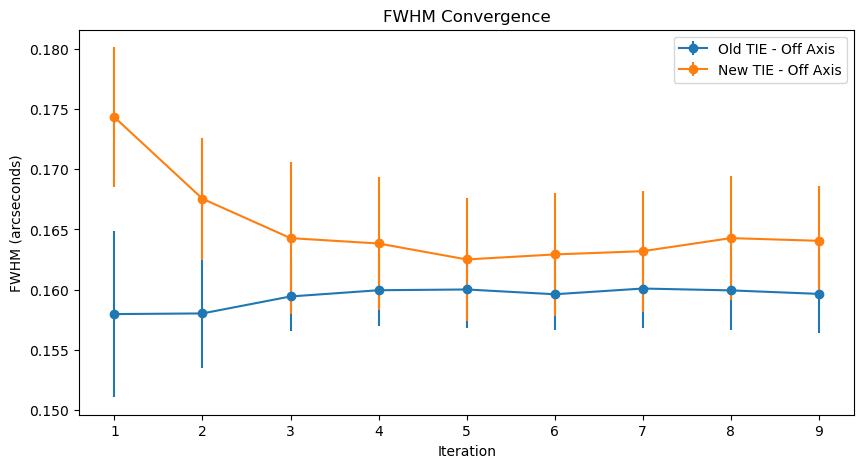

In [65]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_old_tie_comcam, axis=0)[1:], yerr=np.std(fwhm_vals_old_tie_comcam, axis=0)[1:], marker='o', label='Old TIE - Off Axis')
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_new_tie_comcam, axis=0)[1:], yerr=np.std(fwhm_vals_new_tie_comcam, axis=0)[1:], marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

## New TIE Timing

In [129]:
from lsst.daf.butler import Butler
old_butler = Butler('../imsim_comparison/old_tie/single_donut_lsstfam_large_pert_off_axis/imsimData/')
new_butler = Butler('../imsim_comparison/new_tie/single_donut_lsstfam_large_pert_off_axis/imsimData/')

In [151]:
import astropy.units as u
from astropy.time import Time
def getTaskTimingData(taskMetadata):
    """Take the task metadata and get the timing data for the quantum
    that performed the task.
    
    Parameters
    ----------
    taskMetadata : dict
        Metadata stored in the butler repo after completion of the task.
        
    Returns
    -------
    float
        Timing data for the task quantum in seconds.
    """
    
    startTime = Time(taskMetadata['quantum']['prepUtc'][:-6])
    endTime = Time(taskMetadata['quantum']['endUtc'][:-6])
    
    return (endTime-startTime).to_value(u.second)

In [182]:
old_task_timing = []
for run_num in np.arange(1002, 1093, 10):
    for metadata_dataset in old_butler.registry.queryDatasets('calcZernikesTask_metadata', collections=f'ts_imsim_{run_num}'):
        task_metadata = old_butler.get(metadata_dataset)
        if len(task_metadata.keys()) < 3:
            continue
        old_task_timing.append(getTaskTimingData(task_metadata))

In [184]:
print(np.mean(old_task_timing))

3.9498382952381226


In [185]:
new_task_timing = []
for run_num in np.arange(1002, 1093, 10):
    for metadata_dataset in new_butler.registry.queryDatasets('calcZernikesTask_metadata', collections=f'ts_imsim_{run_num}'):
        task_metadata = new_butler.get(metadata_dataset)
        if len(task_metadata.keys()) < 3:
            continue
        new_task_timing.append(getTaskTimingData(task_metadata))

In [187]:
print(np.mean(new_task_timing))

5.365582252380513


# Danish

## LSSTFam Comparison

In [120]:
dir_name = 'danish/single_donut_lsstfam'
opd_danish_raft_centers = {}
wep_danish_raft_centers = {}
pssn_vals_danish_raft_centers = []
fwhm_vals_danish_raft_centers = []
for iter_num in range(10):
    opd_danish_raft_centers[iter_num], wep_danish_raft_centers[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_danish_raft_centers_single_iter, fwhm_vals_new_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_danish_raft_centers.append(pssn_vals_danish_raft_centers_single_iter)
    fwhm_vals_danish_raft_centers.append(fwhm_vals_new_tie_single_iter)
pssn_vals_danish_raft_centers = np.array(pssn_vals_danish_raft_centers).T
fwhm_vals_danish_raft_centers = np.array(fwhm_vals_danish_raft_centers).T

In [121]:
dir_name = 'new_tie/single_donut_lsstfam_large_pert_off_axis/'
opd_new_tie_off_axis = {}
wep_new_tie_off_axis = {}
pssn_vals_new_tie_off_axis = []
fwhm_vals_new_tie_off_axis = []
for iter_num in range(10):
    opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_new_tie_off_axis_single_iter, fwhm_vals_new_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_new_tie_off_axis.append(pssn_vals_new_tie_off_axis_single_iter)
    fwhm_vals_new_tie_off_axis.append(fwhm_vals_new_tie_single_iter)
pssn_vals_new_tie_off_axis = np.array(pssn_vals_new_tie_off_axis).T
fwhm_vals_new_tie_off_axis = np.array(fwhm_vals_new_tie_off_axis).T

### First Iteration

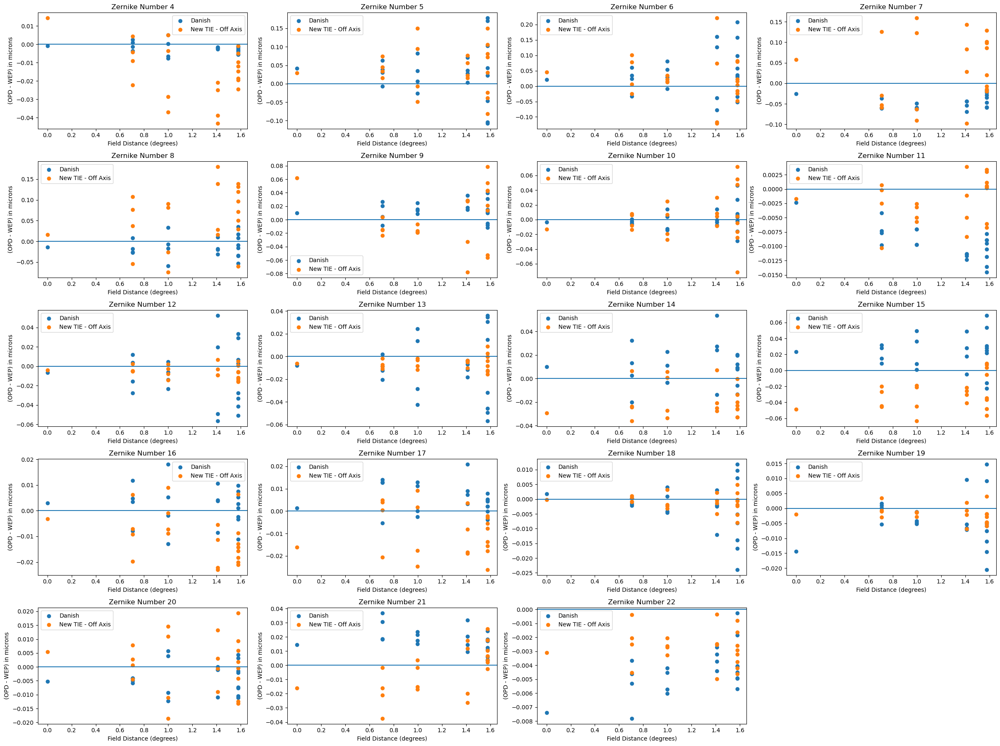

In [75]:
iter_num = 0
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_iter_0[:, i-4], label='Danish')
    plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_iter_0[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0, 0, 1.6)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

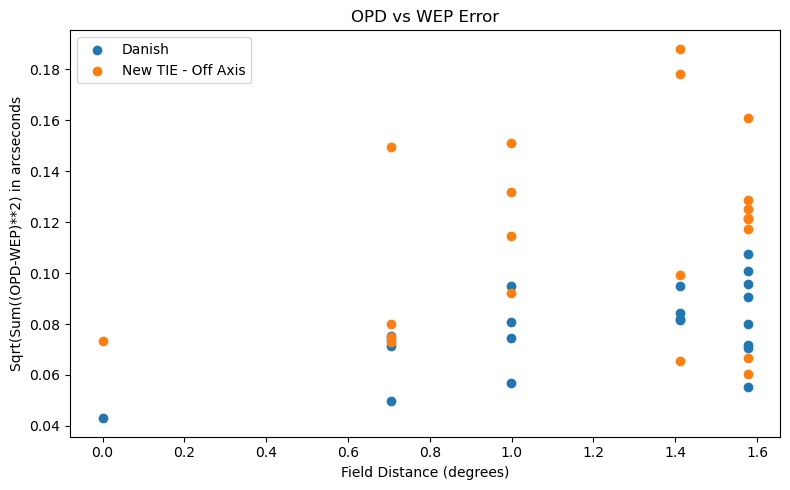

In [76]:
fig = plt.figure(figsize=(8,5))
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0, label='Danish')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0, label='New TIE - Off Axis')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend()
plt.tight_layout()

### Final Iteration

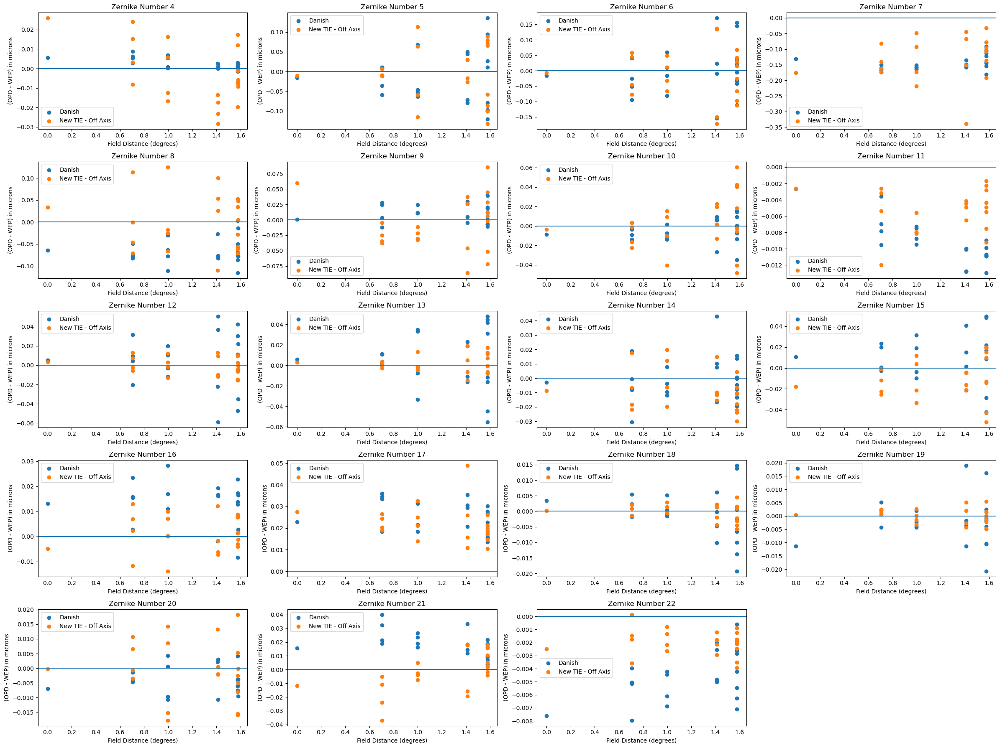

In [77]:
iter_num = 9
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_off_axis_iter_9 = get_opd_comparison(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_iter_9 = get_opd_comparison(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_iter_9[:, i-4], label='Danish')
    plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_iter_9[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

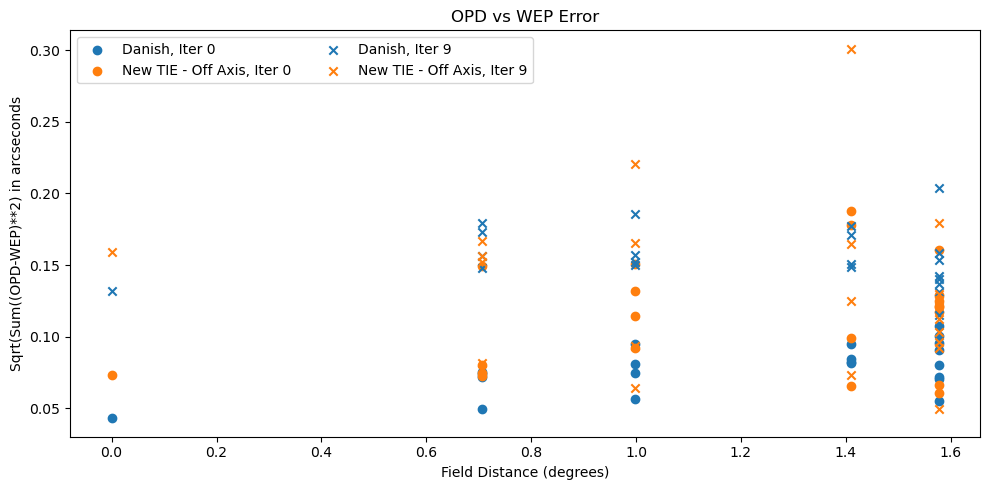

In [78]:
fig = plt.figure(figsize=(10,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0, label='Danish, Iter 0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0, label='New TIE - Off Axis, Iter 0')
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9, label='Danish, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=2)
plt.tight_layout()

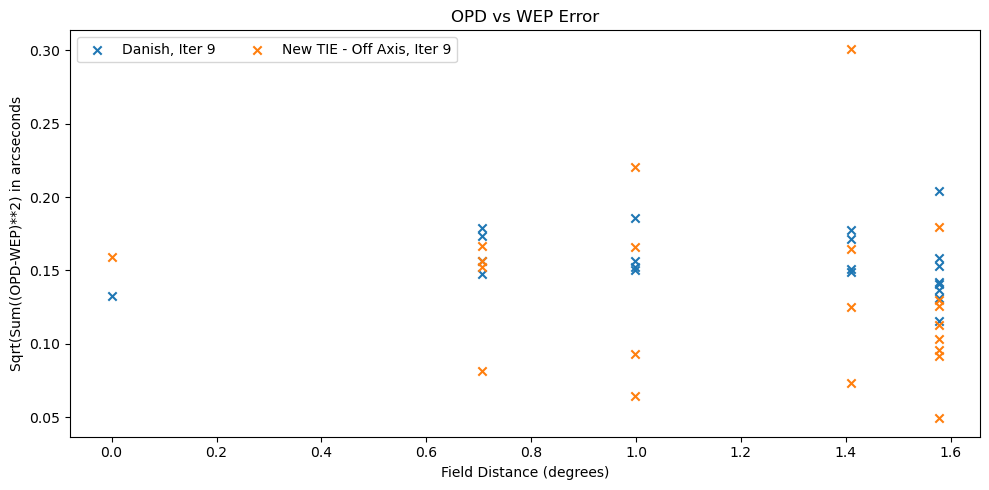

In [79]:
fig = plt.figure(figsize=(10,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9, label='Danish, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=2)
plt.tight_layout()

### Convergence

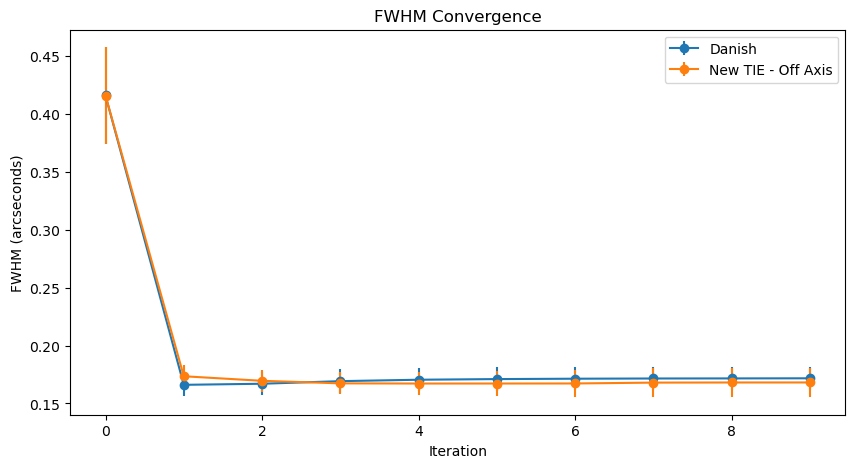

In [80]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(10), np.mean(fwhm_vals_danish_raft_centers, axis=0), yerr=np.std(fwhm_vals_danish_raft_centers, axis=0), marker='o', label='Danish')
plt.errorbar(np.arange(10), np.mean(fwhm_vals_new_tie_off_axis, axis=0), yerr=np.std(fwhm_vals_new_tie_off_axis, axis=0), marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

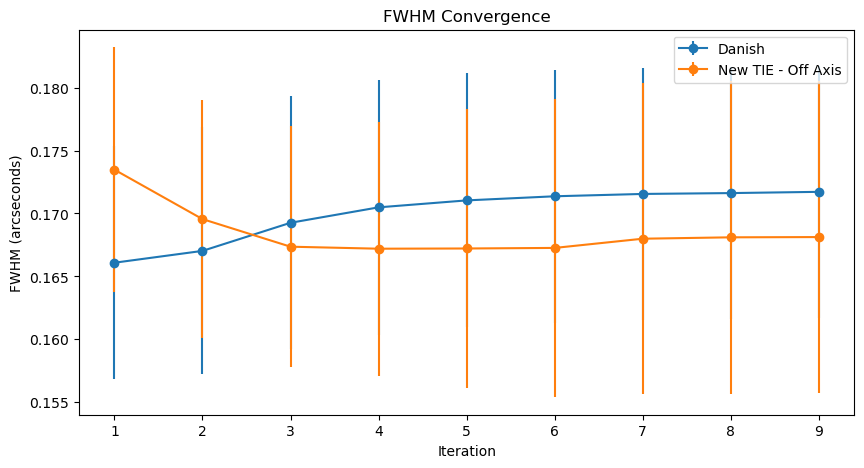

In [81]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_danish_raft_centers, axis=0)[1:], yerr=np.std(fwhm_vals_danish_raft_centers, axis=0)[1:], marker='o', label='Danish')
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_new_tie_off_axis, axis=0)[1:], yerr=np.std(fwhm_vals_new_tie_off_axis, axis=0)[1:], marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

## LSSTFam Comparison w/o atmosphere

In [108]:
dir_name = 'danish/single_donut_lsstfam_no_atm'
opd_danish_raft_centers = {}
wep_danish_no_atm_raft_centers = {}
pssn_vals_danish_no_atm_raft_centers = []
fwhm_vals_danish_no_atm_raft_centers = []
for iter_num in range(10):
    opd_danish_raft_centers[iter_num], wep_danish_no_atm_raft_centers[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_danish_no_atm_raft_centers_single_iter, fwhm_vals_new_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_danish_no_atm_raft_centers.append(pssn_vals_danish_no_atm_raft_centers_single_iter)
    fwhm_vals_danish_no_atm_raft_centers.append(fwhm_vals_new_tie_single_iter)
pssn_vals_danish_no_atm_raft_centers = np.array(pssn_vals_danish_no_atm_raft_centers).T
fwhm_vals_danish_no_atm_raft_centers = np.array(fwhm_vals_danish_no_atm_raft_centers).T

In [109]:
dir_name = 'new_tie/single_donut_lsstfam_no_atm/'
opd_new_tie_off_axis = {}
wep_new_tie_no_atm_off_axis = {}
pssn_vals_new_tie_no_atm_off_axis = []
fwhm_vals_new_tie_no_atm_off_axis = []
for iter_num in range(10):
    opd_new_tie_off_axis[iter_num], wep_new_tie_no_atm_off_axis[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_new_tie_no_atm_off_axis_single_iter, fwhm_vals_new_tie_no_atm_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_new_tie_no_atm_off_axis.append(pssn_vals_new_tie_no_atm_off_axis_single_iter)
    fwhm_vals_new_tie_no_atm_off_axis.append(fwhm_vals_new_tie_no_atm_single_iter)
pssn_vals_new_tie_no_atm_off_axis = np.array(pssn_vals_new_tie_no_atm_off_axis).T
fwhm_vals_new_tie_no_atm_off_axis = np.array(fwhm_vals_new_tie_no_atm_off_axis).T

### First Iteration

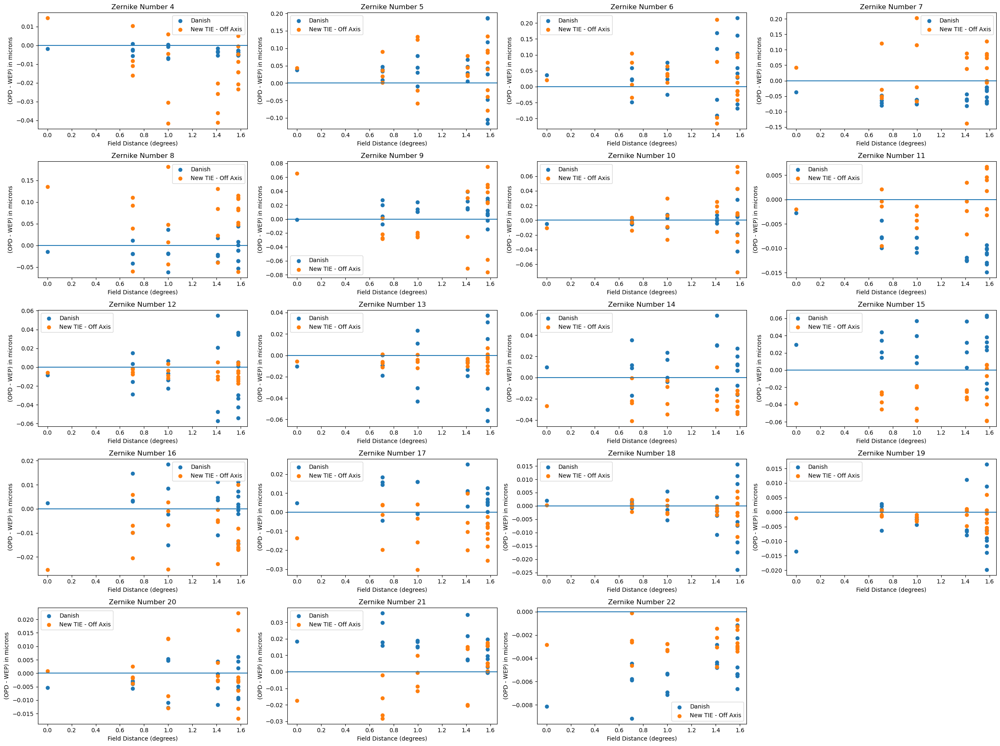

In [110]:
iter_num = 0
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_no_atm_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_no_atm_off_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_iter_0[:, i-4], label='Danish')
    plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_iter_0[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0, 0, 1.6)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

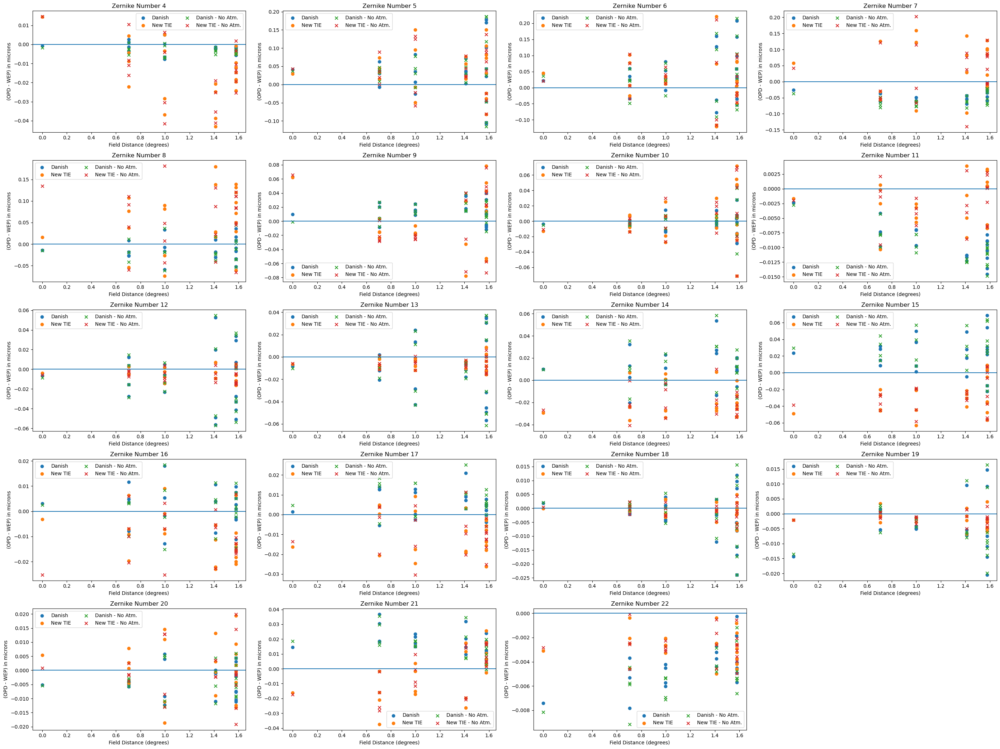

In [125]:
iter_num = 0
fig = plt.figure(figsize=(28,21))
danish_field_distance, danish_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_raft_centers[iter_num], camera)
danish_no_atm_field_distance, danish_no_atm_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_no_atm_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
new_tie_no_atm_field_distance, new_tie_no_atm_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_no_atm_off_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(danish_field_distance, danish_differences_off_axis_iter_0[:, i-4], label='Danish')
    plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_iter_0[:, i-4], label='New TIE')
    plt.scatter(danish_no_atm_field_distance, danish_no_atm_differences_off_axis_iter_0[:, i-4], label='Danish - No Atm.', marker='x')
    plt.scatter(new_tie_field_distance, new_tie_no_atm_differences_off_axis_iter_0[:, i-4], label='New TIE - No Atm.', marker='x')
    plt.axhline(0, 0, 1.6)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend(ncol=2)
plt.tight_layout()

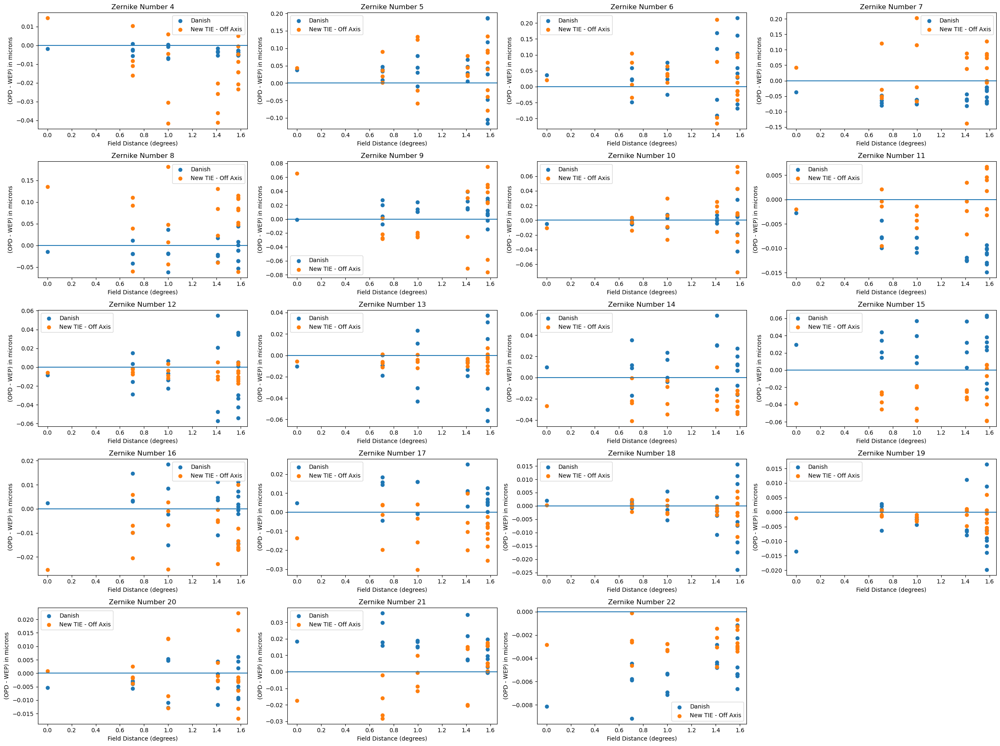

In [111]:
iter_num = 0
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_no_atm_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_iter_0 = get_opd_comparison(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_no_atm_off_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_iter_0[:, i-4], label='Danish')
    plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_iter_0[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0, 0, 1.6)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

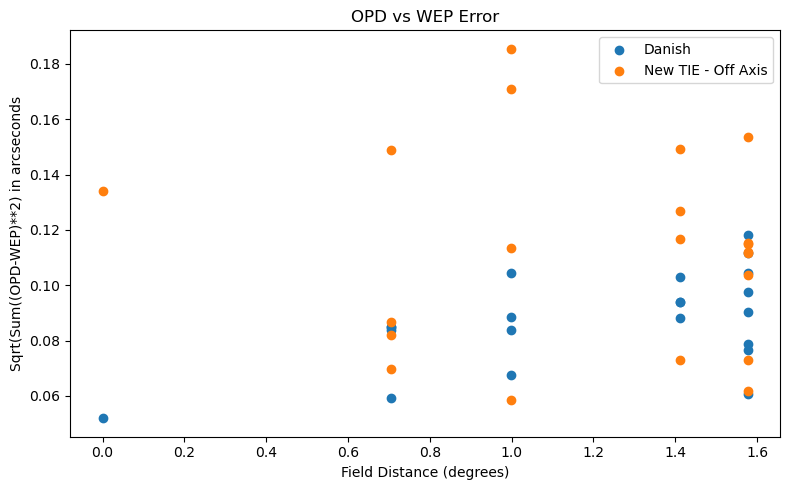

In [112]:
fig = plt.figure(figsize=(8,5))
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_no_atm_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_no_atm_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0, label='Danish')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0, label='New TIE - Off Axis')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend()
plt.tight_layout()

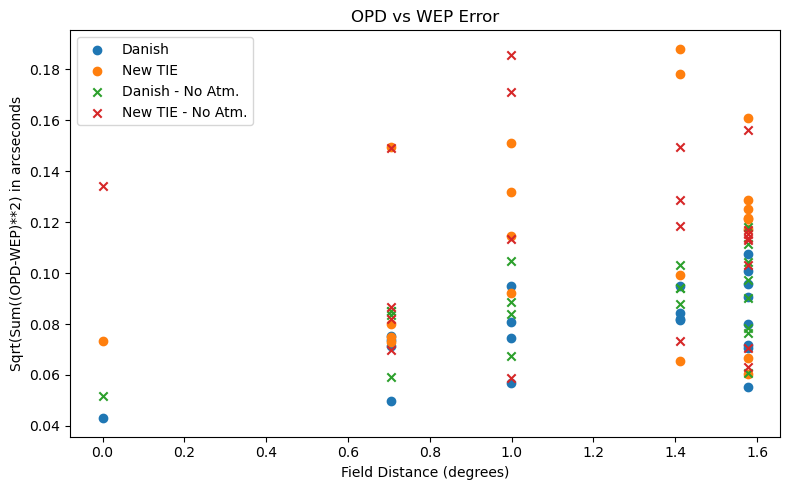

In [128]:
fig = plt.figure(figsize=(8,5))
old_tie_field_distance, old_tie_differences_no_atm_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_no_atm_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_no_atm_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_no_atm_off_axis[iter_num], camera)
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0, label='Danish')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0, label='New TIE')
plt.scatter(old_tie_field_distance, old_tie_differences_no_atm_off_axis_fwhm_iter_0, label='Danish - No Atm.', marker='x')
plt.scatter(new_tie_field_distance, new_tie_differences_no_atm_off_axis_fwhm_iter_0, label='New TIE - No Atm.', marker='x')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend()
plt.tight_layout()

### Final Iteration

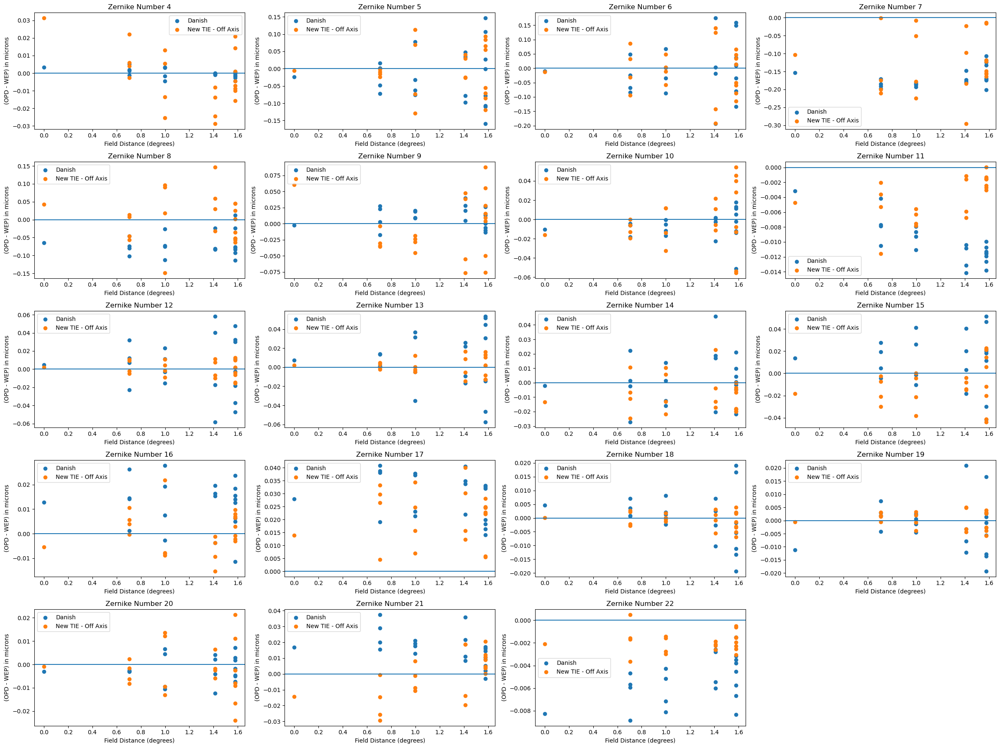

In [113]:
iter_num = 9
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_off_axis_iter_9 = get_opd_comparison(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_no_atm_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_iter_9 = get_opd_comparison(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_no_atm_off_axis[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_iter_9[:, i-4], label='Danish')
    plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_iter_9[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

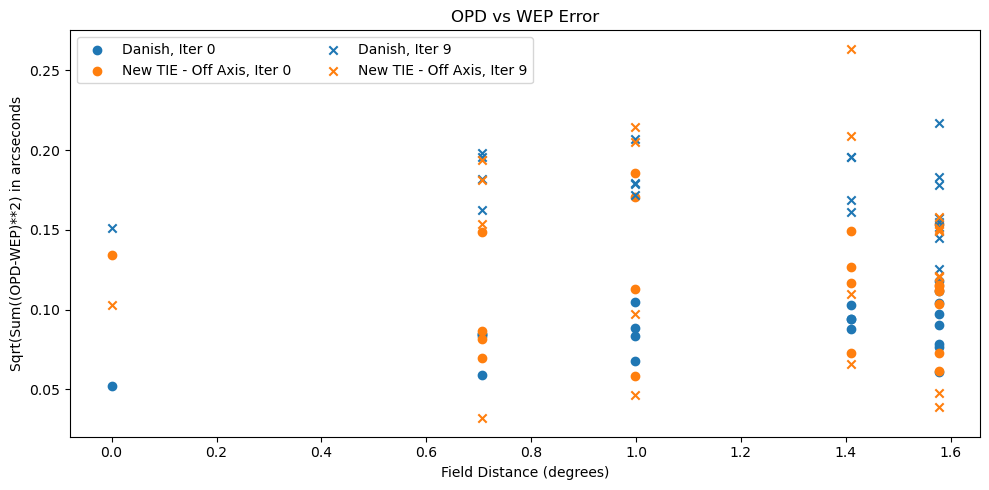

In [114]:
fig = plt.figure(figsize=(10,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_no_atm_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_no_atm_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_0, label='Danish, Iter 0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_0, label='New TIE - Off Axis, Iter 0')
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9, label='Danish, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=2)
plt.tight_layout()

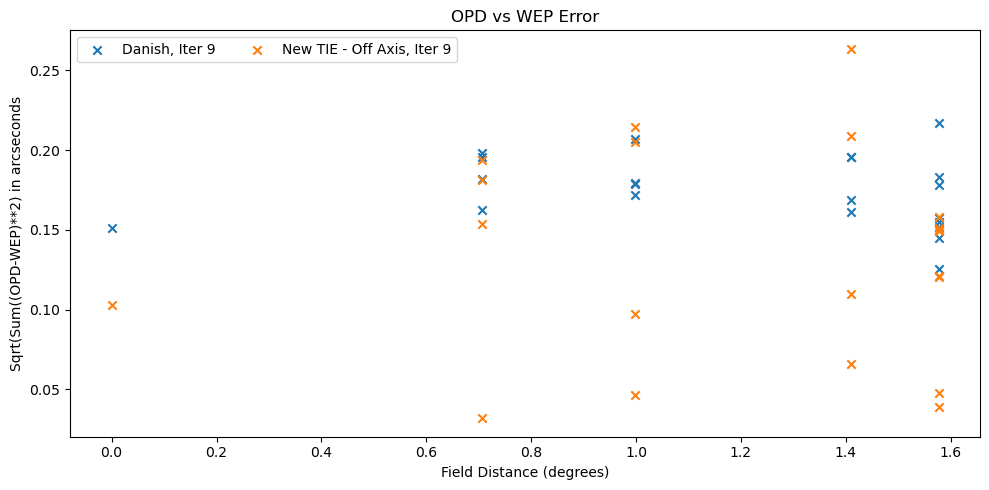

In [115]:
fig = plt.figure(figsize=(10,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_danish_raft_centers[iter_num], wep_danish_no_atm_raft_centers[iter_num], camera)
new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9 = get_opd_comparison_fwhm(fam_center_ids, opd_new_tie_off_axis[iter_num], wep_new_tie_no_atm_off_axis[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_off_axis_fwhm_iter_9, label='Danish, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_off_axis_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=2)
plt.tight_layout()

### Convergence

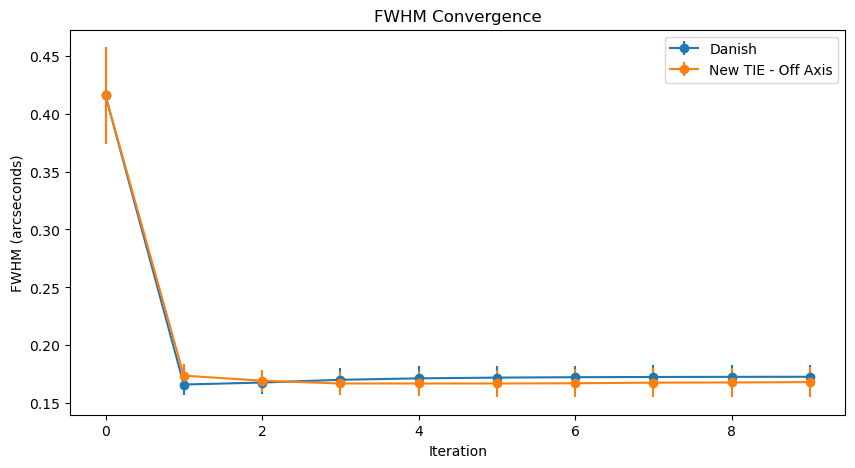

In [116]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(10), np.mean(fwhm_vals_danish_no_atm_raft_centers, axis=0), yerr=np.std(fwhm_vals_danish_no_atm_raft_centers, axis=0), marker='o', label='Danish')
plt.errorbar(np.arange(10), np.mean(fwhm_vals_new_tie_no_atm_off_axis, axis=0), yerr=np.std(fwhm_vals_new_tie_no_atm_off_axis, axis=0), marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

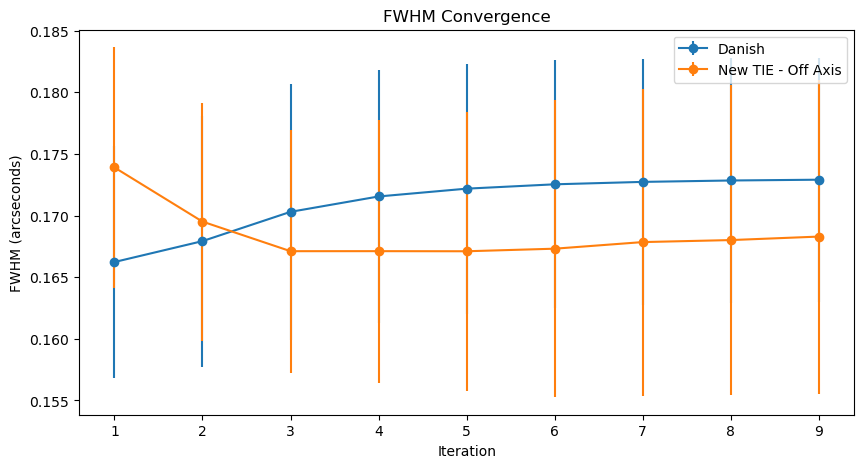

In [117]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_danish_no_atm_raft_centers, axis=0)[1:], yerr=np.std(fwhm_vals_danish_no_atm_raft_centers, axis=0)[1:], marker='o', label='Danish')
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_new_tie_no_atm_off_axis, axis=0)[1:], yerr=np.std(fwhm_vals_new_tie_no_atm_off_axis, axis=0)[1:], marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

## CWFS Comparisons

In [92]:
dir_name = 'danish/single_donut_cwfs/'
opd_danish_cwfs = {}
wep_danish_cwfs = {}
pssn_vals_danish_cwfs = []
fwhm_vals_danish_cwfs = []
for iter_num in range(10):
    opd_danish_cwfs[iter_num], wep_danish_cwfs[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_danish_cwfs_single_iter, fwhm_vals_old_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_danish_cwfs.append(pssn_vals_danish_cwfs_single_iter)
    fwhm_vals_danish_cwfs.append(fwhm_vals_old_tie_single_iter)
pssn_vals_danish_cwfs = np.array(pssn_vals_danish_cwfs).T
fwhm_vals_danish_cwfs = np.array(fwhm_vals_danish_cwfs).T

### First Iteration

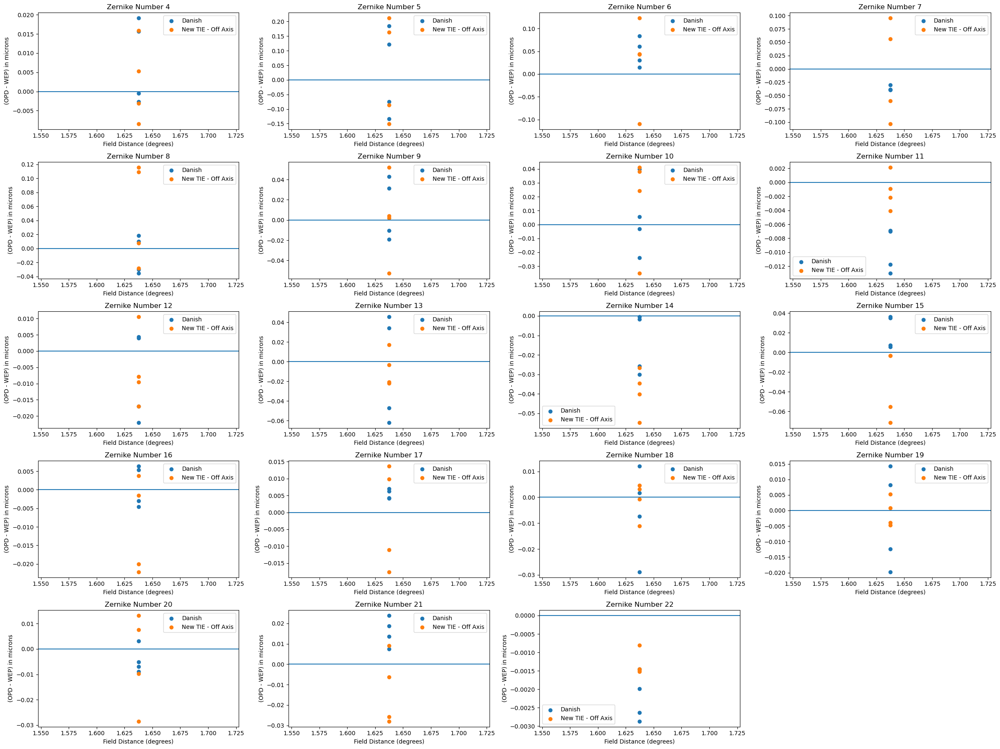

In [93]:
iter_num = 0
cwfs_det_ids = [191, 195, 199, 203]
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_cwfs_iter_0 = get_opd_comparison(cwfs_det_ids, opd_danish_cwfs[iter_num], wep_danish_cwfs[iter_num], camera)
new_tie_field_distance, new_tie_differences_cwfs_iter_0 = get_opd_comparison(cwfs_det_ids, opd_new_tie_cwfs[iter_num], wep_new_tie_cwfs[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_iter_0[:, i-4], label='Danish')
    plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_iter_0[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

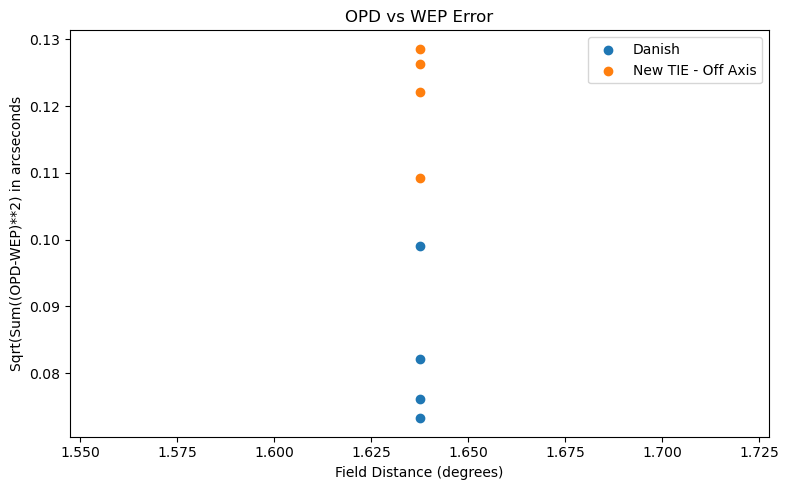

In [94]:
fig = plt.figure(figsize=(8,5))
old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_0 = get_opd_comparison_fwhm(cwfs_det_ids, opd_danish_cwfs[iter_num], wep_danish_cwfs[iter_num], camera)
new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_0 = get_opd_comparison_fwhm(cwfs_det_ids, opd_new_tie_cwfs[iter_num], wep_new_tie_cwfs[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_0, label='Danish')
plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_0, label='New TIE - Off Axis')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend()
plt.tight_layout()

### Final Iteration

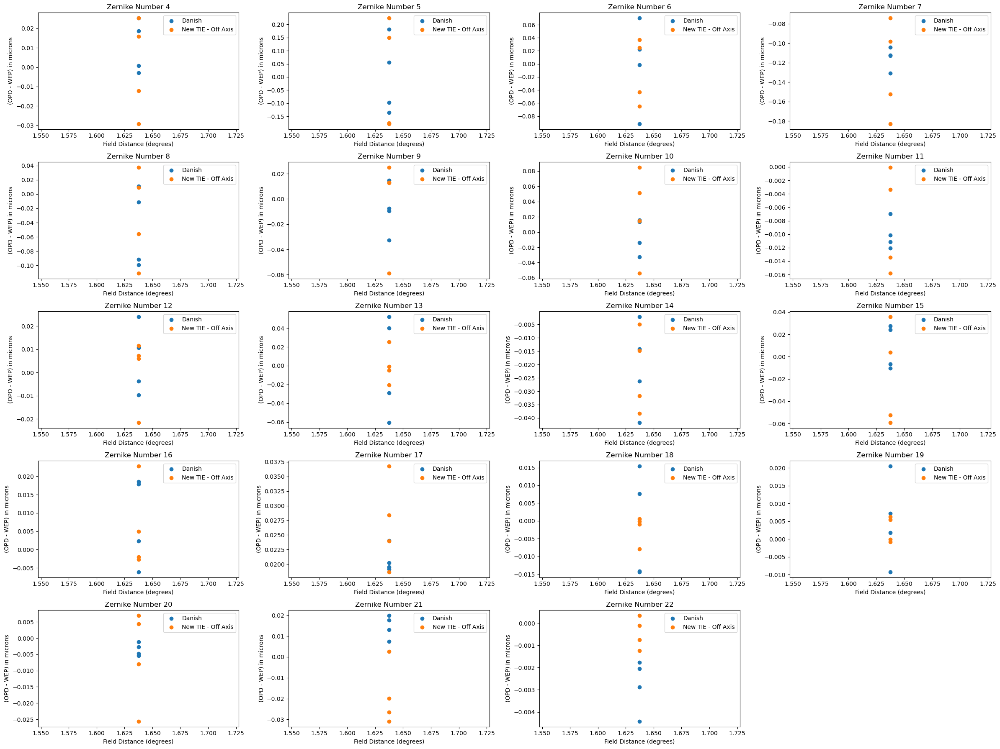

In [95]:
iter_num = 9
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_cwfs_iter_9 = get_opd_comparison(cwfs_det_ids, opd_danish_cwfs[iter_num], wep_danish_cwfs[iter_num], camera)
new_tie_field_distance, new_tie_differences_cwfs_iter_9 = get_opd_comparison(cwfs_det_ids, opd_new_tie_cwfs[iter_num], wep_new_tie_cwfs[iter_num], camera)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_iter_9[:, i-4], label='Danish')
    plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_iter_9[:, i-4], label='New TIE - Off Axis')
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

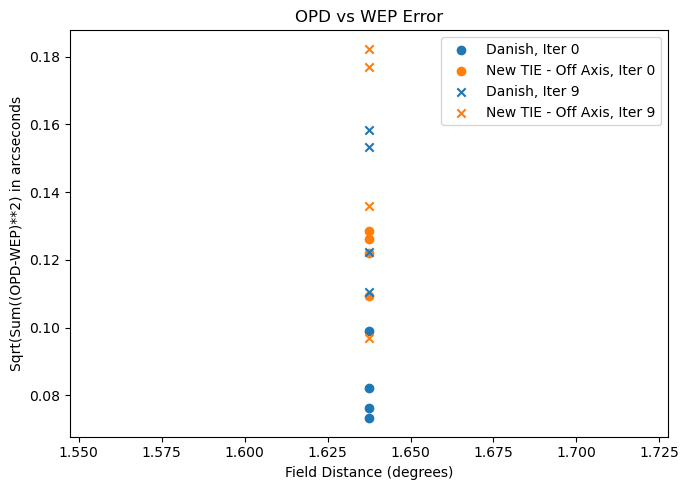

In [96]:
fig = plt.figure(figsize=(7,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_9 = get_opd_comparison_fwhm(cwfs_det_ids, opd_danish_cwfs[iter_num], wep_danish_cwfs[iter_num], camera)
new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_9 = get_opd_comparison_fwhm(cwfs_det_ids, opd_new_tie_cwfs[iter_num], wep_new_tie_cwfs[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_0, label='Danish, Iter 0')
plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_0, label='New TIE - Off Axis, Iter 0')
plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_9, label='Danish, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=1)
plt.tight_layout()

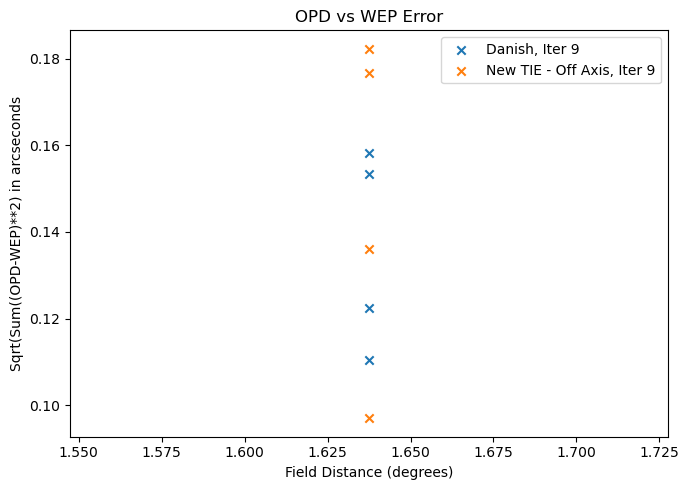

In [97]:
fig = plt.figure(figsize=(7,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_9 = get_opd_comparison_fwhm(cwfs_det_ids, opd_danish_cwfs[iter_num], wep_danish_cwfs[iter_num], camera)
new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_9 = get_opd_comparison_fwhm(cwfs_det_ids, opd_new_tie_cwfs[iter_num], wep_new_tie_cwfs[iter_num], camera)
plt.scatter(old_tie_field_distance, old_tie_differences_cwfs_fwhm_iter_9, label='Danish, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_cwfs_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=1)
plt.tight_layout()

### Convergence

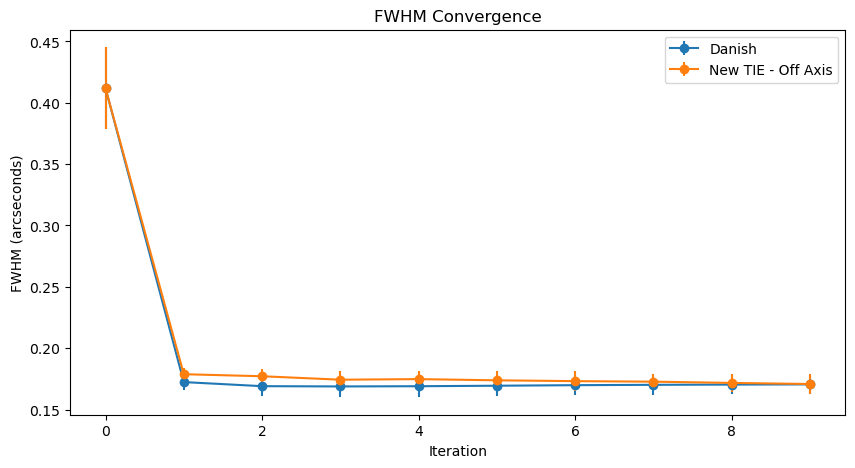

In [98]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(10), np.mean(fwhm_vals_danish_cwfs, axis=0), yerr=np.std(fwhm_vals_danish_cwfs, axis=0), marker='o', label='Danish')
plt.errorbar(np.arange(10), np.mean(fwhm_vals_new_tie_cwfs, axis=0), yerr=np.std(fwhm_vals_new_tie_cwfs, axis=0), marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

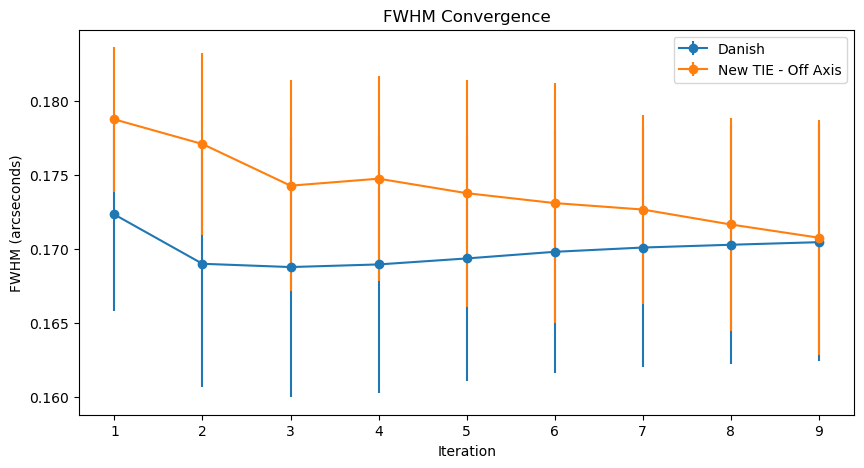

In [99]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_danish_cwfs, axis=0)[1:], yerr=np.std(fwhm_vals_danish_cwfs, axis=0)[1:], marker='o', label='Danish')
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_new_tie_cwfs, axis=0)[1:], yerr=np.std(fwhm_vals_new_tie_cwfs, axis=0)[1:], marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

## Comcam Comparisons

In [100]:
dir_name = 'danish/single_donut_comcam/'
opd_danish_comcam = {}
wep_danish_comcam = {}
pssn_vals_danish_comcam = []
fwhm_vals_danish_comcam = []
for iter_num in range(10):
    opd_danish_comcam[iter_num], wep_danish_comcam[iter_num] = load_opd_wep_results(dir_name, iter_num)
    pssn_vals_danish_comcam_single_iter, fwhm_vals_old_tie_single_iter = load_pssn_results(dir_name, iter_num)
    pssn_vals_danish_comcam.append(pssn_vals_danish_comcam_single_iter)
    fwhm_vals_danish_comcam.append(fwhm_vals_old_tie_single_iter)
pssn_vals_danish_comcam = np.array(pssn_vals_danish_comcam).T
fwhm_vals_danish_comcam = np.array(fwhm_vals_danish_comcam).T

### First Iteration

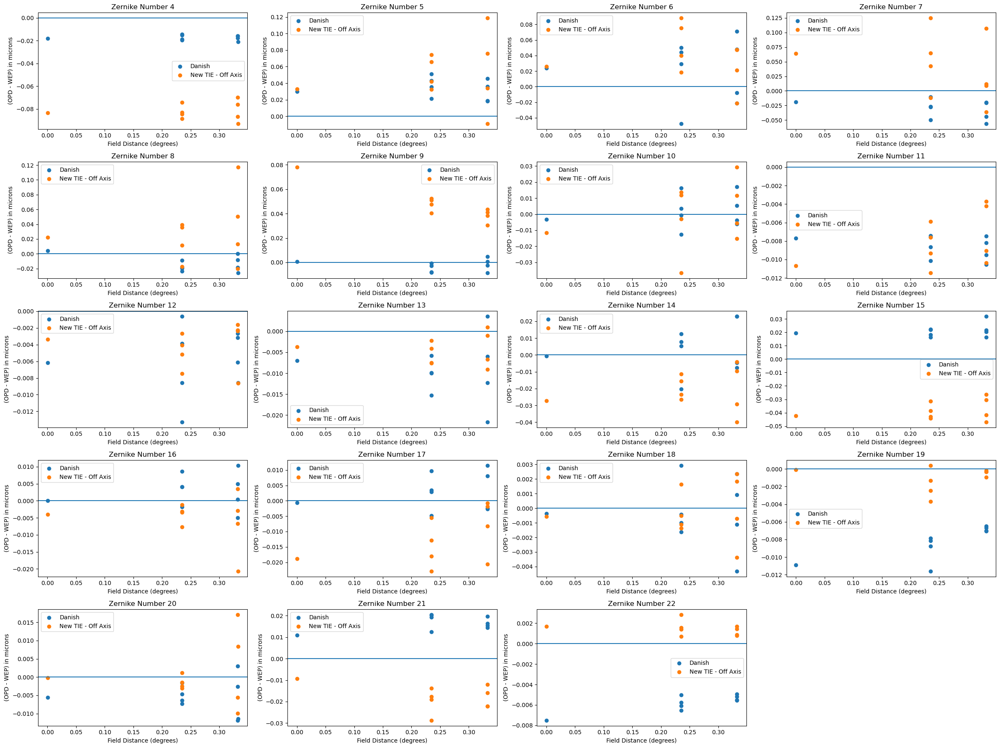

In [101]:
iter_num = 0
comcam_det_ids = np.arange(9)
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_comcam_iter_0 = get_opd_comparison(comcam_det_ids, opd_danish_comcam[iter_num], wep_danish_comcam[iter_num], comcam)
new_tie_field_distance, new_tie_differences_comcam_iter_0 = get_opd_comparison(comcam_det_ids, opd_new_tie_comcam[iter_num], wep_new_tie_comcam[iter_num], comcam)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_comcam_iter_0[:, i-4], label='Danish')
    plt.scatter(new_tie_field_distance, new_tie_differences_comcam_iter_0[:, i-4], label='New TIE - Off Axis')
    plt.axhline(0)
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

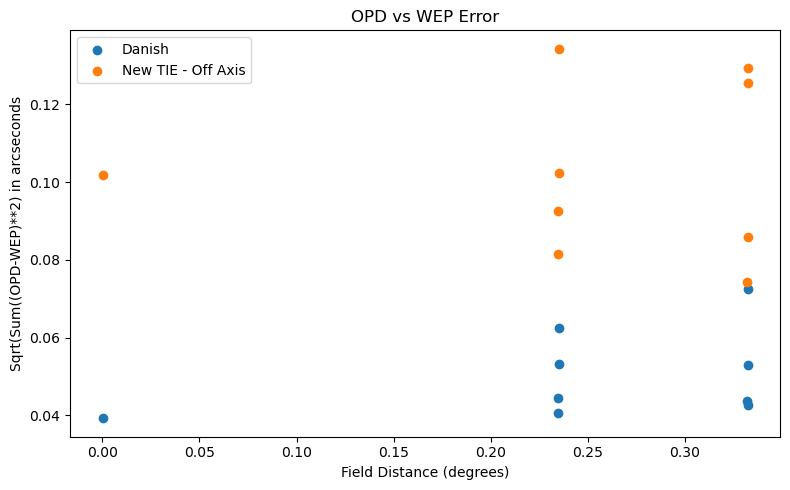

In [102]:
fig = plt.figure(figsize=(8,5))
old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_0 = get_opd_comparison_fwhm(comcam_det_ids, opd_danish_comcam[iter_num], wep_danish_comcam[iter_num], comcam)
new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_0 = get_opd_comparison_fwhm(comcam_det_ids, opd_new_tie_comcam[iter_num], wep_new_tie_comcam[iter_num], comcam)
plt.scatter(old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_0, label='Danish')
plt.scatter(new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_0, label='New TIE - Off Axis')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend()
plt.tight_layout()

### Final Iteration

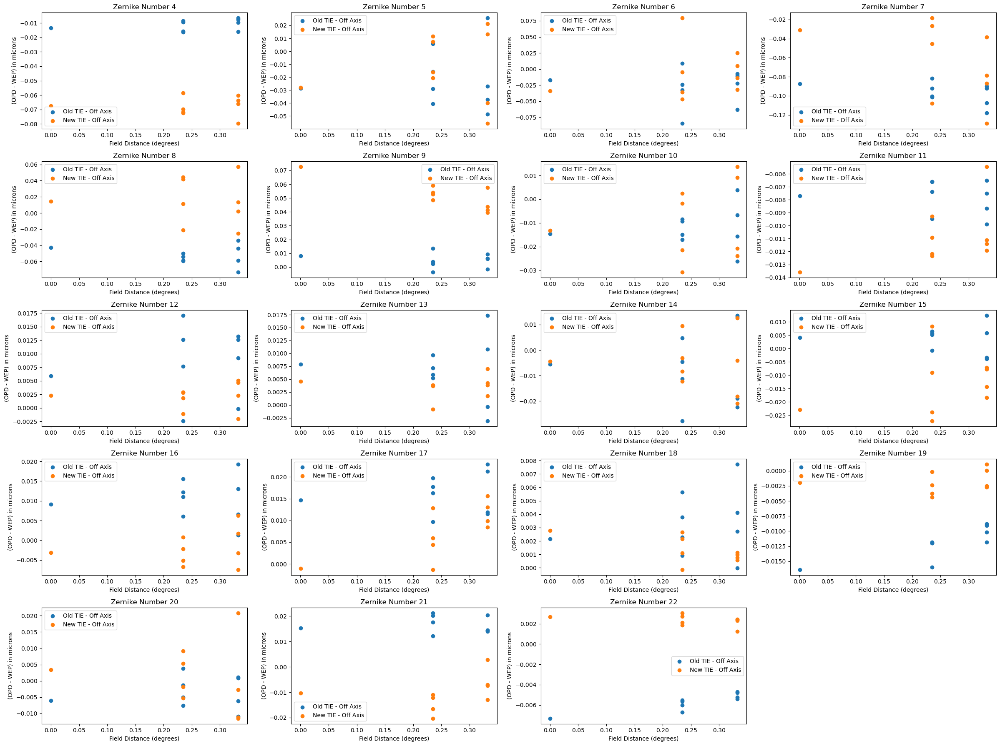

In [103]:
iter_num = 9
fig = plt.figure(figsize=(24,18))
old_tie_field_distance, old_tie_differences_comcam_iter_9 = get_opd_comparison(comcam_det_ids, opd_danish_comcam[iter_num], wep_danish_comcam[iter_num], comcam)
new_tie_field_distance, new_tie_differences_comcam_iter_9 = get_opd_comparison(comcam_det_ids, opd_new_tie_comcam[iter_num], wep_new_tie_comcam[iter_num], comcam)
for i in range(4,23):
    fig.add_subplot(5,4,i-3)
    plt.scatter(old_tie_field_distance, old_tie_differences_comcam_iter_9[:, i-4], label='Old TIE - Off Axis')
    plt.scatter(new_tie_field_distance, new_tie_differences_comcam_iter_9[:, i-4], label='New TIE - Off Axis')
    plt.xlabel('Field Distance (degrees)')
    plt.ylabel('(OPD - WEP) in microns')
    plt.title(f'Zernike Number {i}')
    plt.legend()
plt.tight_layout()

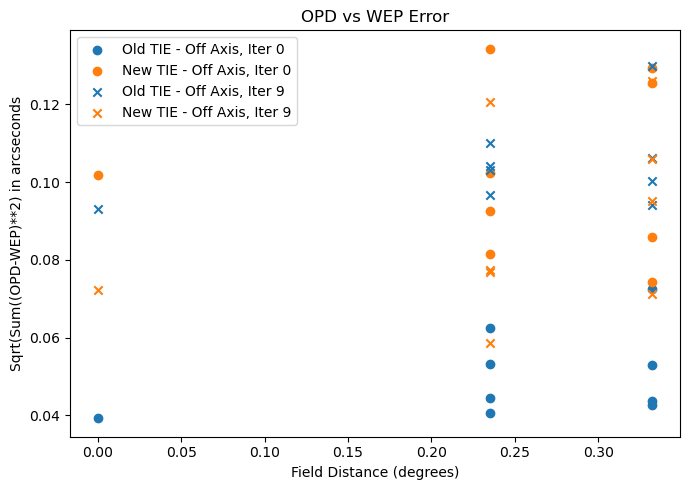

In [104]:
fig = plt.figure(figsize=(7,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_9 = get_opd_comparison_fwhm(comcam_det_ids, opd_danish_comcam[iter_num], wep_danish_comcam[iter_num], comcam)
new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_9 = get_opd_comparison_fwhm(comcam_det_ids, opd_new_tie_comcam[iter_num], wep_new_tie_comcam[iter_num], comcam)
plt.scatter(old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_0, label='Old TIE - Off Axis, Iter 0')
plt.scatter(new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_0, label='New TIE - Off Axis, Iter 0')
plt.scatter(old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_9, label='Old TIE - Off Axis, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=1)
plt.tight_layout()

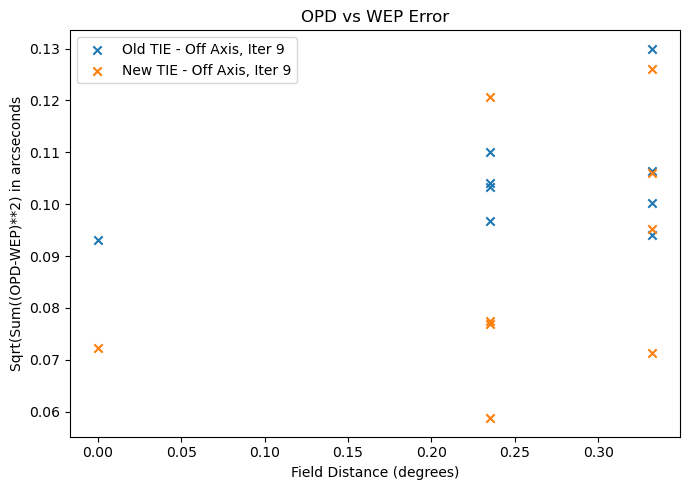

In [105]:
fig = plt.figure(figsize=(7,5))
iter_num = 9
old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_9 = get_opd_comparison_fwhm(comcam_det_ids, opd_danish_comcam[iter_num], wep_danish_comcam[iter_num], comcam)
new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_9 = get_opd_comparison_fwhm(comcam_det_ids, opd_new_tie_comcam[iter_num], wep_new_tie_comcam[iter_num], comcam)
plt.scatter(old_tie_field_distance, old_tie_differences_comcam_fwhm_iter_9, label='Old TIE - Off Axis, Iter 9', marker='x', c='C0')
plt.scatter(new_tie_field_distance, new_tie_differences_comcam_fwhm_iter_9, label='New TIE - Off Axis, Iter 9', marker='x', c='C1')
plt.xlabel('Field Distance (degrees)')
plt.ylabel('Sqrt(Sum((OPD-WEP)**2) in arcseconds')
plt.title(f'OPD vs WEP Error')
plt.legend(ncols=1)
plt.tight_layout()

### Convergence

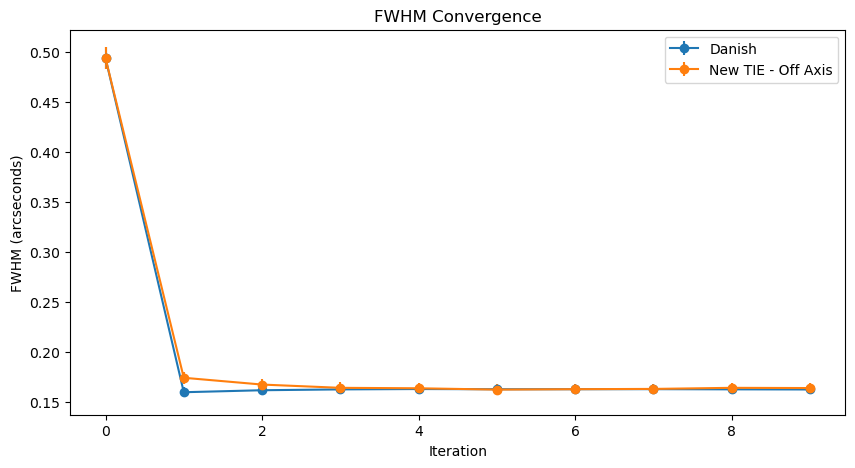

In [106]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(10), np.mean(fwhm_vals_danish_comcam, axis=0), yerr=np.std(fwhm_vals_danish_comcam, axis=0), marker='o', label='Danish')
plt.errorbar(np.arange(10), np.mean(fwhm_vals_new_tie_comcam, axis=0), yerr=np.std(fwhm_vals_new_tie_comcam, axis=0), marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

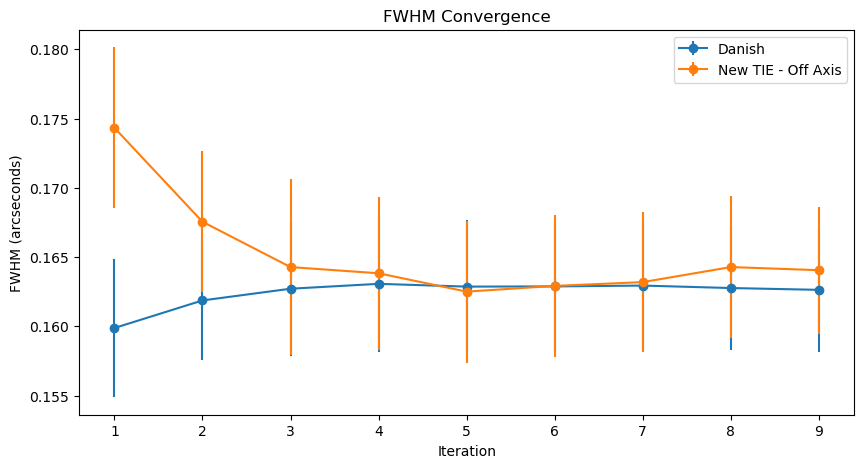

In [107]:
fig = plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_danish_comcam, axis=0)[1:], yerr=np.std(fwhm_vals_danish_comcam, axis=0)[1:], marker='o', label='Danish')
plt.errorbar(np.arange(1,10), np.mean(fwhm_vals_new_tie_comcam, axis=0)[1:], yerr=np.std(fwhm_vals_new_tie_comcam, axis=0)[1:], marker='o', label='New TIE - Off Axis')
plt.xlabel('Iteration')
plt.ylabel('FWHM (arcseconds)')
plt.title('FWHM Convergence')
plt.legend()

## Danish Timing

In [190]:
danish_butler = Butler('../imsim_comparison/danish/single_donut_lsstfam/imsimData/')
danish_task_timing = []
for run_num in np.arange(1002, 1093, 10):
    for metadata_dataset in danish_butler.registry.queryDatasets('calcZernikesTask_metadata', collections=f'ts_imsim_{run_num}'):
        task_metadata = danish_butler.get(metadata_dataset)
        if len(task_metadata.keys()) < 3:
            continue
        danish_task_timing.append(getTaskTimingData(task_metadata))

In [199]:
print(np.mean(old_task_timing), np.std(old_task_timing))

3.9498382952381226 0.8009938389844318


In [196]:
print(np.mean(new_task_timing), np.std(new_task_timing))

5.365582252380513 0.506847724062606


In [198]:
print(np.mean(danish_task_timing), np.std(danish_task_timing))

10.970357790475685 1.0525331106955358
